In [1]:
from fairmd.idp.protein_functions import *
import yaml

#databankPath = "/home/sosamuli/work/NMRlipids/IDPdatabank/"  # this is the local path for the cloned Databank
#os.environ["NMLDB_ROOT_PATH"] = "/home/sosamuli/work/NMRlipids/IDPdatabank/"

databankPath = "/home/sosamuli/work/NMRlipids/IDPsimBank/"  # this is the local path for the cloned Databank
os.environ["NMLDB_ROOT_PATH"] = "/home/sosamuli/work/NMRlipids/IDPsimBank/"


# These two lines include core Databank routines and Databank API
from fairmd.idp.core import *
from fairmd.idp.databankLibrary import *
# This is for plotting
from fairmd.idp.databankio import *
from fairmd.idp.plottings import plotSimulation
#from IPython.display import display, Markdown

# This initializes the databank and stores the information of all simulations into a list.
# Each list item contains the information from README.yaml file of the given simulation.
systems = initialize_databank()

/home/sosamuli/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Databank initialized from the folder: /home/sosamuli/work/NMRlipids/IDPsimBank/Data/Simulations


In [2]:
#IDs = list(range(1, 25))
#IDs.remove(23)

protein = 'ChiZ1-64'
#protein = 'KRS1-72'
#protein = 'asyn'

all_IDs = []
for system in systems:
    if protein in system['SYSTEM']:
        all_IDs.append(system['ID'])
IDs = all_IDs

#files = []

#for system in systems:
#    #print(system['TRJ'][0][0])
#    try:
#        if system['ID'] in IDs:
#            dataFolder = '../../Data/Simulations/' + system['path'] + system['TRJ'][0][0]
#            print(dataFolder)
#    except:
#        continue

In [3]:
print(IDs)

[24, 43, 20, 18, 33, 34, 32, 6, 16, 36, 3, 41, 19, 10, 44, 28, 29, 4, 22, 2, 11, 7, 12, 47, 35]


KRS1-72
[['replica_01_AMBER99SB-DISP_md_2000ns.xtc']]


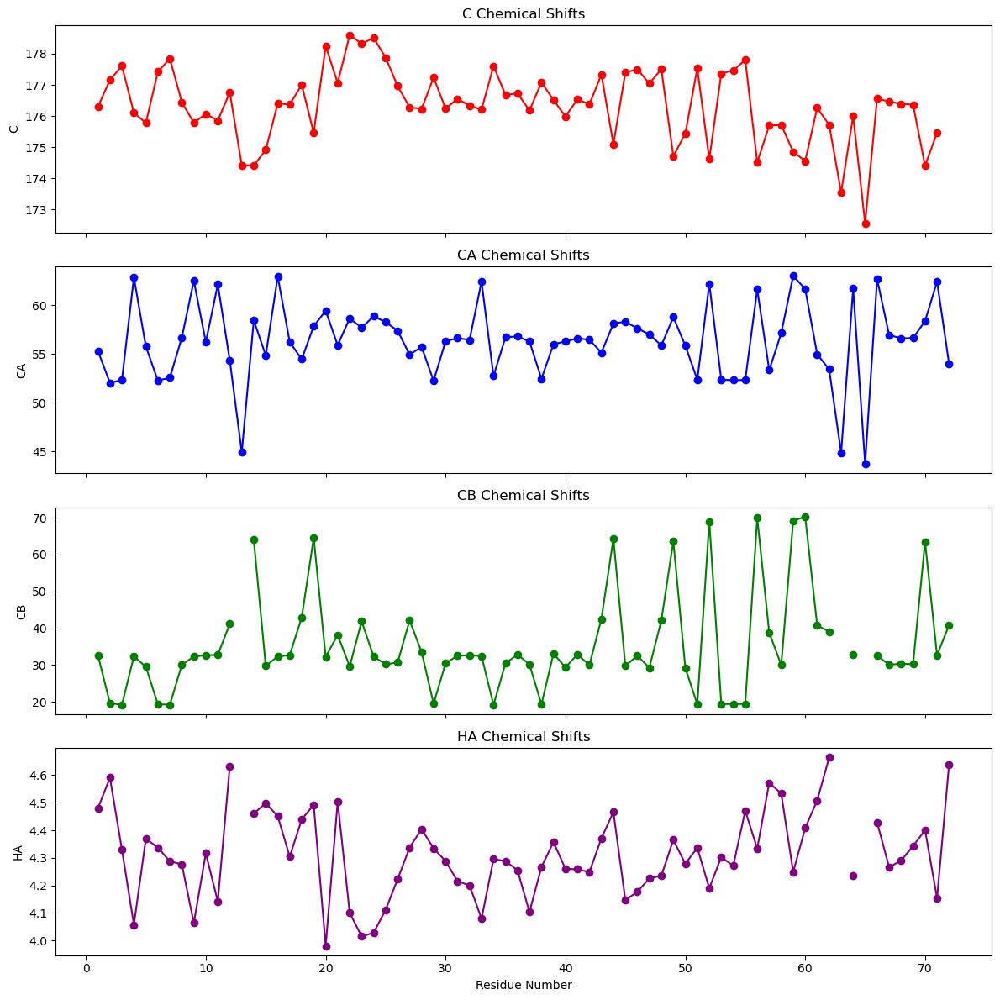

In [4]:
ID = 46

for system in systems:
    if system['ID'] == ID:
        dataFolder = '../../Data/Simulations/' + system['path']
        print(system['SYSTEM'])
        print(system['TRJ'])

# Example input data (you can replace this with reading from YAML or JSON if needed)

chemical_shifts_file = dataFolder + 'chemical_shifts_sparta.yaml'

with open(chemical_shifts_file, "r") as file:
    data = yaml.safe_load(file)   

# Extract residue numbers
residues = sorted(data.keys())

# Extract values for each nucleus of interest
C_values = [data[res].get("C", float("nan")) for res in residues]
CA_values = [data[res].get("CA", float("nan")) for res in residues]
CB_values = [data[res].get("CB", float("nan")) for res in residues]
HA_values = [data[res].get("HA", float("nan")) for res in residues]

# Plotting
fig, axs = plt.subplots(4, 1, figsize=(12, 12), sharex=True)

axs[0].plot(residues, C_values, marker='o', color='red')
axs[0].set_ylabel("C")
axs[0].set_title("C Chemical Shifts")

axs[1].plot(residues, CA_values, marker='o', color='blue')
axs[1].set_ylabel("CA")
axs[1].set_title("CA Chemical Shifts")

axs[2].plot(residues, CB_values, marker='o', color='green')
axs[2].set_ylabel("CB")
axs[2].set_title("CB Chemical Shifts")

axs[3].plot(residues, HA_values, marker='o', color='purple')
axs[3].set_ylabel("HA")
axs[3].set_title("HA Chemical Shifts")
axs[3].set_xlabel("Residue Number")

plt.tight_layout()
plt.show()


ChiZ1-64
[['replica_01_AMBER99SB-DISP_md_1500ns.xtc']]
ChiZ1-64
[['replica_02_DESAMBER_md_1500ns.xtc']]
ChiZ1-64
[['replica_03_DESAMBER_md_1500ns.xtc']]
ChiZ1-64
[['replica_02_CHARMM36M_md_1500ns.xtc']]
ChiZ1-64
[['replica_04_DESAMBER_md_1500ns.xtc']]
ChiZ1-64
[['replica_05_AMBER99SBWS_md_1500ns.xtc']]
ChiZ1-64
[['replica_05_DESAMBER_md_1500ns.xtc']]
ChiZ1-64
[['replica_05_AMBER03WS_md_1500ns.xtc']]
ChiZ1-64
[['replica_01_DESAMBER_md_1500ns.xtc']]
ChiZ1-64
[['replica_04_CHARMM36M_md_1500ns.xtc']]
ChiZ1-64
[['replica_03_AMBER03WS_md_1500ns.xtc']]
ChiZ1-64
[['replica_04_AMBER99SB-DISP_md_1500ns.xtc']]
ChiZ1-64
[['replica_03_AMBER99SB-DISP_md_1500ns.xtc']]
ChiZ1-64
[['replica_04_AMBER03WS_md_1500ns.xtc']]
ChiZ1-64
[['replica_02_AMBER03WS_md_1500ns.xtc']]
ChiZ1-64
[['replica_01_CHARMM36M_md_1500ns.xtc']]
ChiZ1-64
[['replica_01_AMBER03WS_md_1500ns.xtc']]
ChiZ1-64
[['replica_04_AMBER99SBWS_md_1500ns.xtc']]
ChiZ1-64
[['replica_05_AMBER99SB-DISP_md_1500ns.xtc']]
ChiZ1-64
[['replica_03_AMBER99S

KeyError: '1'

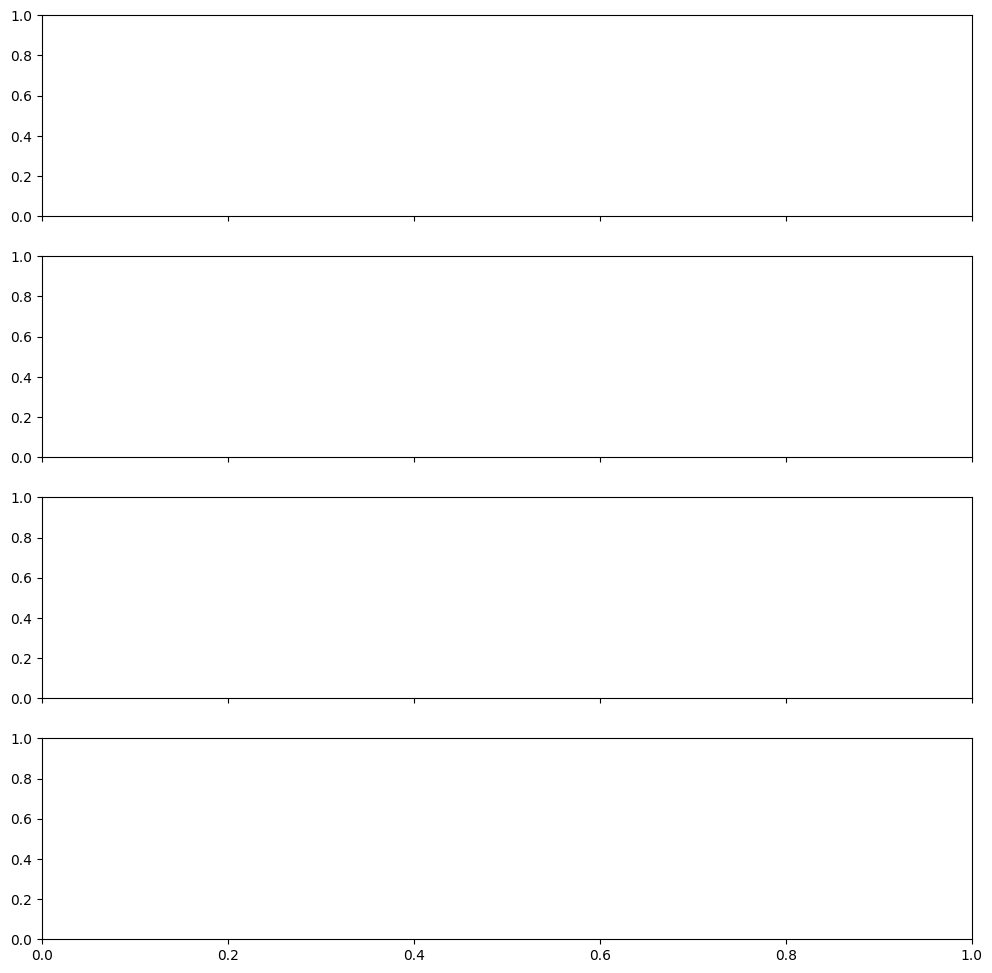

In [5]:
#IDs = [2, 3]

files = []

for system in systems:
    if system['ID'] in IDs:
        dataFolder = '../../Data/Simulations/' + system['path']
        chemical_shifts_file = dataFolder + 'chemical_shifts_sparta.yaml'
        files.append(chemical_shifts_file)
        print(system['SYSTEM'])
        print(system['TRJ'])

# List of files to compare
#files = [
#    dataFolder + "chemical_shifts_sparta.yaml",
#    dataFolder + "chemical_shifts_other.yaml",
#    dataFolder + "chemical_shifts_third.yaml",
#]

# Colors for different datasets
colors = ["red", "blue", "green", "purple", "orange", "brown"]

# Nuclei of interest
nuclei = ["C", "CA", "CB", "HA"]

# Create subplots (1 per nucleus)
fig, axs = plt.subplots(len(nuclei), 1, figsize=(12, 12), sharex=True)

for file_idx, filename in enumerate(files):
    with open(filename, "r") as f:
        raw_data = yaml.safe_load(f)

    # Convert keys to int → value dicts
    data = {int(k): v for k, v in raw_data.items()}

    # Residues sorted as integers
    residues = sorted(data.keys())
    ## Extract residues as integers
    #residues = sorted(map(int, data.keys()))

    for ax, nucleus in zip(axs, nuclei):
        values = [data[str(res)].get(nucleus, float("nan")) for res in residues]
        ax.plot(
            residues,
            values,
            marker="o",
            linewidth=1,
            label=os.path.basename(filename).replace(".yaml", ""),
            color=colors[file_idx % len(colors)]
        )
        ax.set_ylabel(nucleus)
        ax.set_title(f"{nucleus} Chemical Shifts")
        ax.grid(True, linestyle="--", alpha=0.6)

# Common X label
axs[-1].set_xlabel("Residue Number")

# Add legends (to the first subplot, or all if you prefer)
axs[0].legend()

plt.tight_layout()
plt.show()


87
asyn
[['replica_02_AMBER03WS_md_2000ns.xtc']]
93
asyn
[['replica_04_DESAMBER_md_2000ns.xtc']]
90
asyn
[['replica_04_CHARMM36M_md_2000ns.xtc']]
71
asyn
[['replica_01_DESAMBER_md_2000ns.xtc']]
76
asyn
[['replica_03_DESAMBER_md_2000ns.xtc']]
88
asyn
[['replica_05_CHARMM36M_md_2000ns.xtc']]
61
asyn
[['replica_01_CHARMM36M_md_2000ns.xtc']]
65
asyn
[['replica_04_AMBER99SB-DISP_md_2000ns.xtc']]
66
asyn
[['replica_01_AMBER99SB-DISP_md_2000ns.xtc']]
73
asyn
[['replica_05_AMBER99SB-DISP_md_2000ns.xtc']]
69
asyn
[['replica_04_AMBER99SBWS_md_2000ns.xtc']]
57
asyn
[['replica_02_CHARMM36M_md_2000ns.xtc']]
91
asyn
[['replica_05_DESAMBER_md_2000ns.xtc']]
98
asyn
[['replica_01_AMBER99SBWS_md_2000ns.xtc']]
63
asyn
[['replica_02_AMBER99SBWS_md_2000ns.xtc']]
77
asyn
[['replica_04_AMBER03WS_md_2000ns.xtc']]
81
asyn
[['replica_03_AMBER03WS_md_2000ns.xtc']]
74
asyn
[['replica_03_CHARMM36M_md_2000ns.xtc']]
89
asyn
[['replica_03_AMBER99SB-DISP_md_2000ns.xtc']]
86
asyn
[['replica_05_AMBER99SBWS_md_2000ns.xtc

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


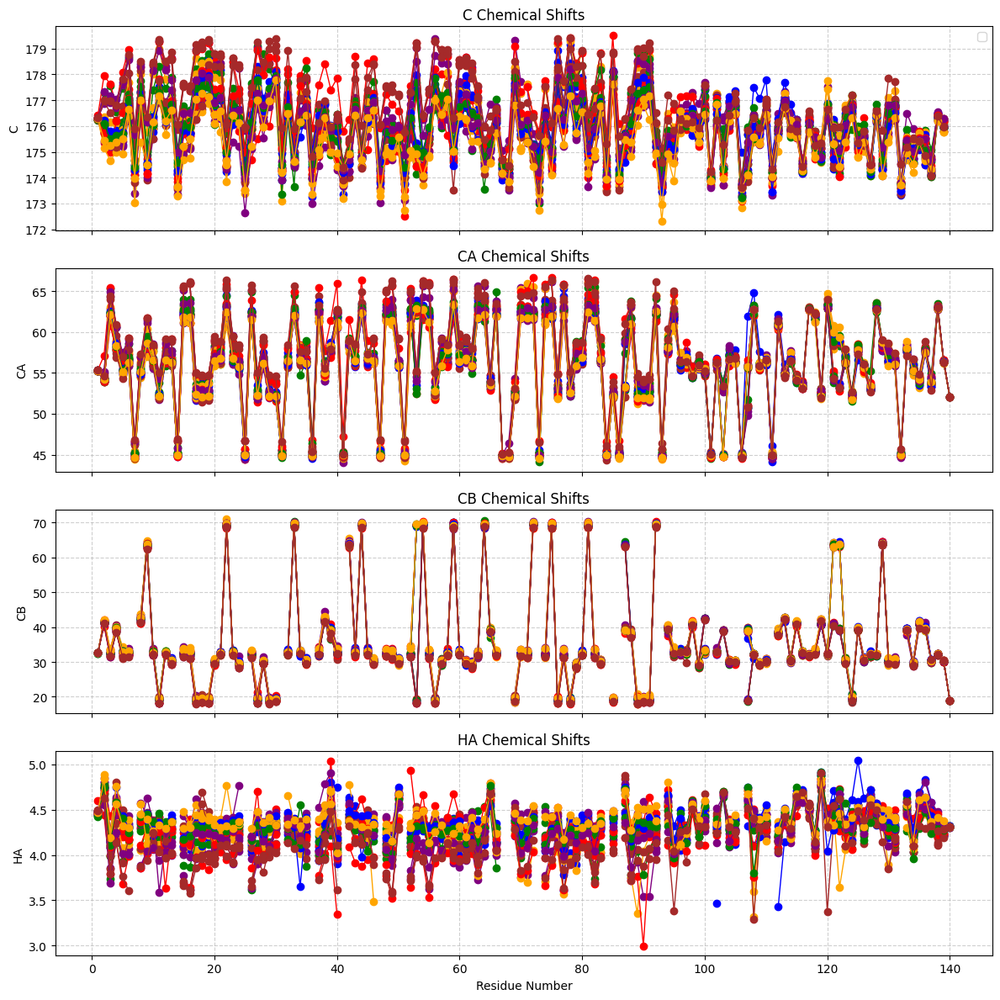

In [10]:
#IDs = list(range(1, 25))
#IDs.remove(23)

files = []

for system in systems:
    if system['ID'] in IDs:
        dataFolder = '../../Data/Simulations/' + system['path']
        chemical_shifts_file = dataFolder + 'chemical_shifts_sparta.yaml'
        files.append(chemical_shifts_file)
        print(system['ID'])
        print(system['SYSTEM'])
        print(system['TRJ'])

# Colors for different datasets
colors = ["red", "blue", "green", "purple", "orange", "brown"]

# Nuclei of interest
nuclei = ["C", "CA", "CB", "HA"]

# Create subplots (1 per nucleus)
fig, axs = plt.subplots(len(nuclei), 1, figsize=(12, 12), sharex=True)

for file_idx, filename in enumerate(files):
    with open(filename, "r") as f:
        raw_data = yaml.safe_load(f)

    # Convert keys to int → value dicts
    data = {int(k): v for k, v in raw_data.items()}

    # Residues sorted as integers
    residues = sorted(data.keys())

    for ax, nucleus in zip(axs, nuclei):
        values = [data.get(res, {}).get(nucleus, float("nan")) for res in residues]
        ax.plot(
            residues,
            values,
            marker="o",
            linewidth=1,
            #label=os.path.basename(filename).replace(".yaml", ""),
            color=colors[file_idx % len(colors)]
        )
        ax.set_ylabel(nucleus)
        ax.set_title(f"{nucleus} Chemical Shifts")
        ax.grid(True, linestyle="--", alpha=0.6)

# Common X label
axs[-1].set_xlabel("Residue Number")

# Add legends (to the first subplot, or all if you prefer)
axs[0].legend()

plt.tight_layout()
plt.show()


KRS1-72
[['replica_05_AMBER99SB-DISP_md_2000ns.xtc']]
19993
KRS1-72
[['replica_02_AMBER99SB-DISP_md_2000ns.xtc']]
19993
KRS1-72
[['replica_02_DESAMBER_md_2000ns.xtc']]
19993
KRS1-72
[['replica_01_AMBER99SB-DISP_md_2000ns.xtc']]
19993
Download complete.
Experimental residues: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
Example residue data: {1: {'HA': 4.513, 'C': 175.96, 'CA': 55.491, 'CB': 32.813}, 2: {'H': 8.206, 'HA': 4.281, 'C': 177.428, 'CA': 52.535, 'CB': 19.059, 'N': 126.18}, 3: {'H': 8.162, 'HA': 4.312, 'C': 177.812, 'CA': 52.378, 'CB': 19.032, 'N': 124.211}, 4: {'H': 8.005, 'HA': 4.069, 'C': 176.253, 'CA': 62.299, 'CB': 32.778, 'N': 120.475}, 5: {'H': 8.331, 'HA': 4.325, 'C': 175.621, 'CA': 55.696, 'CB': 29.404, 'N': 125.106}}


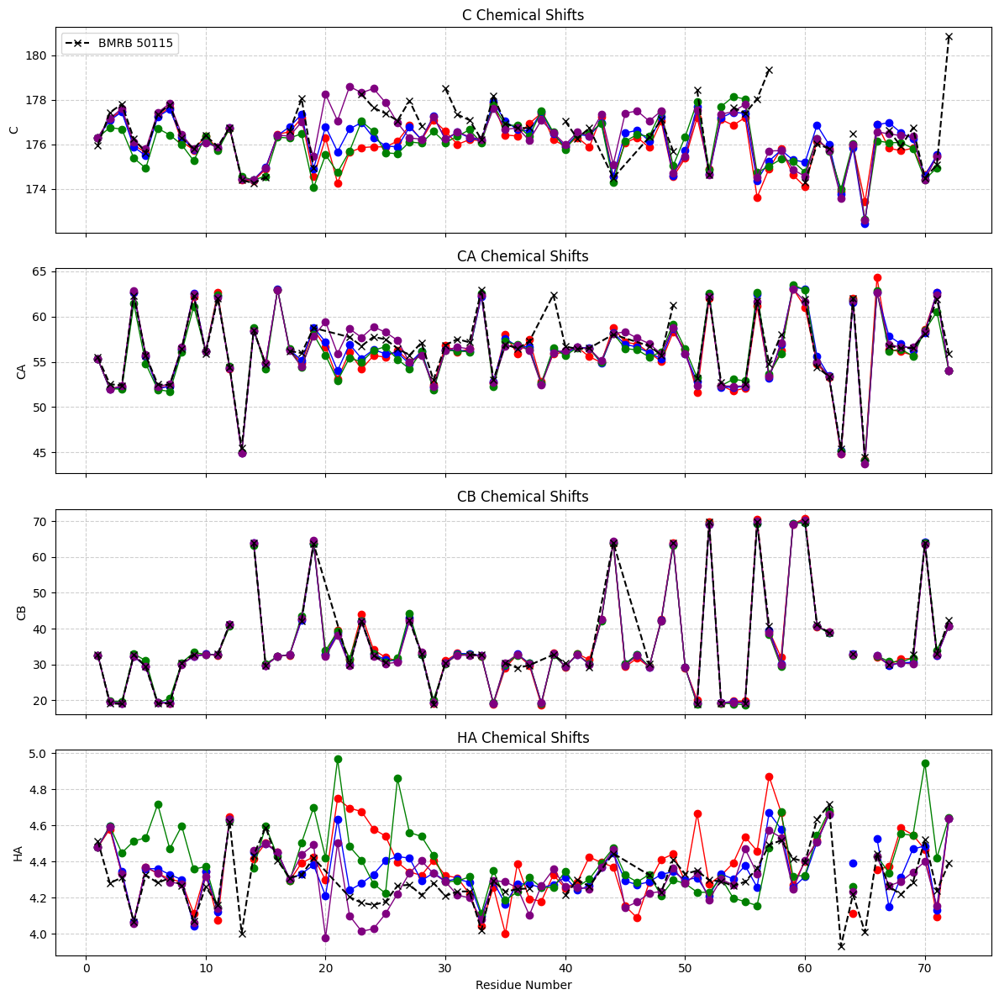

In [5]:
import yaml
import matplotlib.pyplot as plt
import os
import requests
import math

# -------------------
# 1. Your simulations
# -------------------

#IDs = list(range(1, 25))
#IDs.remove(23)

IDs = [46, 38, 1, 48]
files = []
sim_residues_all = set()

for system in systems:
    if system['ID'] in IDs:
        dataFolder = '../../Data/Simulations/' + system['path']
        chemical_shifts_file = dataFolder + 'chemical_shifts_sparta.yaml'
        files.append(chemical_shifts_file)
        print(system['SYSTEM'])
        print(system['TRJ'])
        # Collect all residue numbers
        with open(chemical_shifts_file) as f:
            raw = yaml.safe_load(f)
            sim_residues_all.update(int(k) for k in raw.keys())
        try:
            BMRBid = system['EXPERIMENT']['spin_relaxation']['path'][0].replace("BMRBid", "", 1)
            print(BMRBid)
        except:
            print('Experimental chemical shift data file not found')
            

colors = ["red", "blue", "green", "purple", "orange", "brown"]
nuclei = ["C", "CA", "CB", "HA"]

# ------------------------
# 2. Download NMR-STAR file
# ------------------------
bmrb_url = "https://bmrb.io/ftp/pub/bmrb/entry_directories/bmr" + BMRBid +"/bmr" + BMRBid + "_3.str"
#bmrb_url = "https://bmrb.io/ftp/pub/bmrb/entry_directories/bmr50115/bmr50115_3.str"#https://bmrb.io/_download/entry/50115/bmr50115.str"
#bmrb_local_file = "bmr50115.str"
bmrb_local_file = "./bmr" + BMRBid + ".str"

if not os.path.exists(bmrb_local_file):
    print("Downloading BMRB NMR-STAR file...")
    r = requests.get(bmrb_url)
    r.raise_for_status()
    with open(bmrb_local_file, "wb") as f:
        f.write(r.content)
    print("Download complete.")

# ------------------------
# 3. Parse NMR-STAR file
# ------------------------

exp_data = parse_star_file(bmrb_local_file)
# Filter to simulation residues
exp_data_filtered = {res: atoms for res, atoms in exp_data.items() if res in sim_residues_all}
exp_residues = sorted(exp_data_filtered.keys())

print("Experimental residues:", exp_residues[:10])
print("Example residue data:", {r: exp_data_filtered[r] for r in exp_residues[:5]})

# ------------------------
# 4. Plotting
# ------------------------
fig, axs = plt.subplots(len(nuclei), 1, figsize=(12, 12), sharex=True)

# Simulated data
for file_idx, filename in enumerate(files):
    with open(filename, "r") as f:
        raw = yaml.safe_load(f)
    sim_data = {int(k): v for k, v in raw.items()}
    residues = sorted(sim_data.keys())

    for ax, nucleus in zip(axs, nuclei):
        values = [sim_data.get(r, {}).get(nucleus, math.nan) for r in residues]
        ax.plot(
            residues,
            values,
            marker="o",
            linewidth=1,
            #label=os.path.basename(filename).replace(".yaml", ""),
            color=colors[file_idx % len(colors)]
        )
        ax.set_ylabel(nucleus)
        ax.set_title(f"{nucleus} Chemical Shifts")
        ax.grid(True, linestyle="--", alpha=0.6)

# Experimental data overlay
for ax, nucleus in zip(axs, nuclei):
    vals_exp = [exp_data_filtered.get(r, {}).get(nucleus, math.nan) for r in exp_residues]
    ax.plot(
        exp_residues,
        vals_exp,
        marker="x",
        linestyle="--",
        color="black",
        label="BMRB 50115"
    )

axs[-1].set_xlabel("Residue Number")
axs[0].legend()
plt.tight_layout()
plt.show()


In [7]:
import math
import numpy as np

# List of nuclei to consider
nuclei = ["C", "CA", "CB", "HA"]

# Example: simulations is a list of tuples [(sim_name, sim_data_dict), ...]
# sim_data_dict: {residue_number: {"C": val, "CA": val, ...}, ...}
# exp_data_filtered: {residue_number: {"C": val, "CA": val, ...}, ...}

# Get the residues present in both simulation and experiment
common_residues = sorted(exp_data_filtered.keys())

# Iterate over all simulations
for sim_name, sim_data in simulations:
    rmsd_vals = compute_rmsd_chemical_shift(sim_data, exp_data_filtered, nuclei, common_residues)
    print(f"RMSDs for {sim_name}:")
    for nuc, rmsd in rmsd_vals.items():
        if rmsd is not None:
            print(f"  {nuc}: {rmsd:.2f} ppm")
        else:
            print(f"  {nuc}: N/A")
    avg_rmsd = np.mean([v for v in rmsd_vals.values() if v is not None])
    print(f"  Average RMSD: {avg_rmsd:.2f} ppm\n")


NameError: name 'simulations' is not defined

In [24]:
import yaml
import requests
import os
import numpy as np

# ------------------------
# Simulation files setup
# ------------------------
#IDs = [2, 3]  # simulation IDs to process
IDs = list(range(1, 25))
IDs.remove(23)

sim_files = []
sim_names = []

sim_residues_all = set()
for system in systems:
    if system['ID'] in IDs:
        dataFolder = '../../Data/Simulations/' + system['path']
        sim_file = os.path.join(dataFolder, 'chemical_shifts_sparta.yaml')
        sim_files.append(sim_file)
        sim_names.append(system['SYSTEM'])
        with open(sim_file) as f:
            raw = yaml.safe_load(f)
            sim_residues_all.update(int(k) for k in raw.keys())

# ------------------------
# Download BMRB file
# ------------------------
bmrb_url = "https://bmrb.io/_download/entry/50115/bmr50115.str"
bmrb_local_file = "bmr50115.str"

if not os.path.exists(bmrb_local_file):
    print("Downloading BMRB NMR-STAR file...")
    r = requests.get(bmrb_url)
    r.raise_for_status()
    with open(bmrb_local_file, "wb") as f:
        f.write(r.content)
    print("Download complete.")

# ------------------------
# Parse NMR-STAR file
# ------------------------

exp_data = parse_star_file(bmrb_local_file)
# Only residues present in simulation
exp_data_filtered = {res: atoms for res, atoms in exp_data.items() if res in sim_residues_all}
exp_residues = sorted(exp_data_filtered.keys())

# ------------------------
# Calculate RMSDs
# ------------------------
nuclei = ["C", "CA", "CB", "HA"]


# Process each simulation
for sim_file, sim_name in zip(sim_files, sim_names):
    with open(sim_file) as f:
        raw = yaml.safe_load(f)
    sim_data = {int(k): v for k, v in raw.items()}
    rmsd_vals = compute_rmsd_chemical_shift(sim_data, exp_data_filtered, nuclei, exp_residues)
    print(f"RMSDs for {sim_file}:")
    for nuc, rmsd in rmsd_vals.items():
        if rmsd is not None:
            print(f"  {nuc}: {rmsd:.2f} ppm")
        else:
            print(f"  {nuc}: N/A")
    avg_rmsd = np.mean([v for v in rmsd_vals.values() if v is not None])
    print(f"  Average RMSD: {avg_rmsd:.2f} ppm\n")


HTTPError: 404 Client Error: Not Found for url: https://bmrb.io/_download/entry/50115/bmr50115.str

In [2]:
#protein = 'ChiZ1-64'
#protein = 'KRS1-72'
protein = 'asyn'

all_IDs = []
for system in systems:
    if protein in system['SYSTEM']:
        all_IDs.append(system['ID'])
IDs = all_IDs

print(IDs)

[87, 93, 90, 71, 76, 88, 61, 65, 66, 73, 69, 57, 91, 98, 63, 77, 81, 74, 89, 86, 102, 52, 53, 92, 62]


asyn
[['replica_01_AMBER03WS_md_2000ns.xtc']]
['BMRBid19257', 'BMRBid16300', 'BMRBid52093', 'BMRBid16543', 'BMRBid26557']
['16300']
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
Experimental residues: ['100LEU', '101GLY', '102LYS', '103ASN', '104GLU', '105GLU', '106GLY', '107ALA', '109GLN', '10LYS']
Example residue data: {'100LEU': {'H': 8.33, 'C': 178.008, 'CA': 54.97, 'CB': 40.944, 'N': 123.452}, '101GLY': {'H': 8.493, 'C': 174.03, 'CA': 44.816, 'N': 110.358}, '102LYS': {'H': 8.23, 'C': 176.452, 'CA': 55.771, 'N': 121.419}, '103ASN': {'H': 8.644, 'C': 175.294, 'CA': 52.992, 'CB': 38.07, 'N': 120.549}, '104GLU': {'H': 8.504, 'C': 176.572, 'CA': 56.225, 'CB': 29.18, 'N': 121.958}}
C
CA
CB
HA
N
H


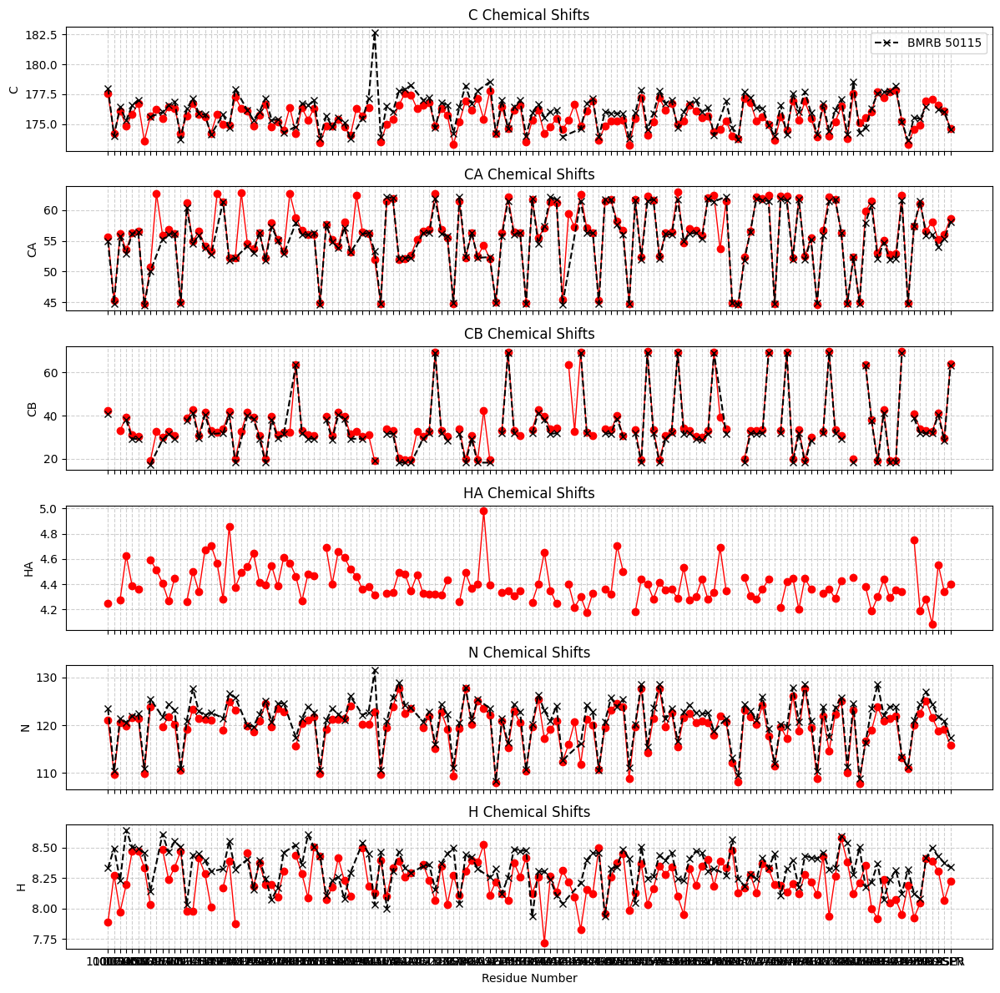

In [3]:
import yaml
import matplotlib.pyplot as plt
import os
import requests
import math

# -------------------
# 1. Your simulations
# -------------------

#IDs = list(range(1, 25))
#IDs.remove(23)

#IDs = [2, 3]
IDs = [102]
files = []
BMRBid = []
sim_residues_all = set()

for system in systems:
    if system['ID'] in IDs:
        dataFolder = '../../Data/Simulations/' + system['path']
        chemical_shifts_file = dataFolder + 'chemical_shifts_sparta.yaml'
        files.append(chemical_shifts_file)
        print(system['SYSTEM'])
        print(system['TRJ'])
        # Collect all residue numbers
        with open(chemical_shifts_file) as f:
            raw = yaml.safe_load(f)
            sim_residues_all.update(k for k in raw.keys())

        print(system['EXPERIMENT']['chemical_shift']['path'])
        BMRBid.append(system['EXPERIMENT']['chemical_shift']['path'][1].replace("BMRBid", "", 1))
        

colors = ["red", "blue", "green", "purple", "orange", "brown"]
nuclei = ["C", "CA", "CB", "HA", "N", "H"]

# ------------------------
# 2. Download NMR-STAR file
# ------------------------



#bmrb_url = "https://bmrb.io/ftp/pub/bmrb/entry_directories/bmr50115/bmr50115_3.str"#https://bmrb.io/_download/entry/50115/bmr50115.str"
#bmrb_local_file = "bmr50115.str"

print(BMRBid)

bmrb_url = "https://bmrb.io/ftp/pub/bmrb/entry_directories/bmr" + BMRBid[0] +"/bmr" + BMRBid[0] + "_3.str"
exp_data_path = '../../Data/Experiments/chemical_shift/BMRBid' + BMRBid[0]
bmrb_local_file = exp_data_path + "/bmr" + BMRBid[0] + ".str"



if not os.path.exists(bmrb_local_file):
    print("Downloading BMRB NMR-STAR file...")
    r = requests.get(bmrb_url)
    r.raise_for_status()
    with open(bmrb_local_file, "wb") as f:
        f.write(r.content)
    print("Download complete.")

# ------------------------
# 3. Parse NMR-STAR file
# ------------------------

exp_data = parse_star_file(bmrb_local_file)
# Filter to simulation residues

print(bmrb_local_file)


exp_data_filtered = {res: atoms for res, atoms in exp_data.items() if res in sim_residues_all}
exp_residues = sorted(exp_data_filtered.keys())

print("Experimental residues:", exp_residues[:10])
print("Example residue data:", {r: exp_data_filtered[r] for r in exp_residues[:5]})

# ------------------------
# 4. Plotting
# ------------------------
fig, axs = plt.subplots(len(nuclei), 1, figsize=(12, 12), sharex=True)

# Simulated data
for file_idx, filename in enumerate(files):
    with open(filename, "r") as f:
        raw = yaml.safe_load(f)
    sim_data = {k: v for k, v in raw.items()}
    residues = sorted(sim_data.keys())

    for ax, nucleus in zip(axs, nuclei):
        values = [sim_data.get(r, {}).get(nucleus, math.nan) for r in residues]
        ax.plot(
            residues,
            values,
            marker="o",
            linewidth=1,
            #label=os.path.basename(filename).replace(".yaml", ""),
            color=colors[file_idx % len(colors)]
        )
        ax.set_ylabel(nucleus)
        ax.set_title(f"{nucleus} Chemical Shifts")
        ax.grid(True, linestyle="--", alpha=0.6)

# Experimental data overlay
for ax, nucleus in zip(axs, nuclei):
    vals_exp = [exp_data_filtered.get(r, {}).get(nucleus, math.nan) for r in exp_residues]
    print(nucleus)
    ax.plot(
        exp_residues,
        vals_exp,
        marker="x",
        linestyle="--",
        color="black",
        label="BMRB 50115"
    )

axs[-1].set_xlabel("Residue Number")
axs[0].legend()
plt.tight_layout()
plt.show()


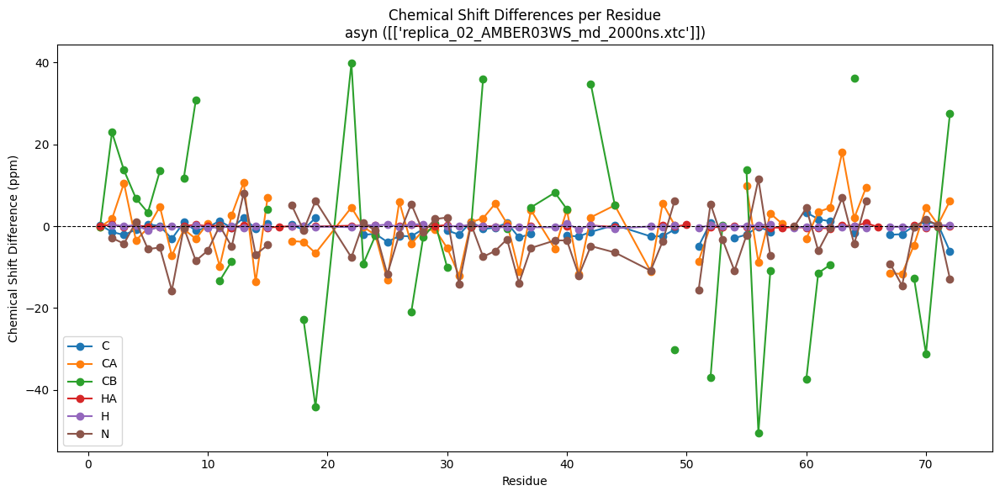

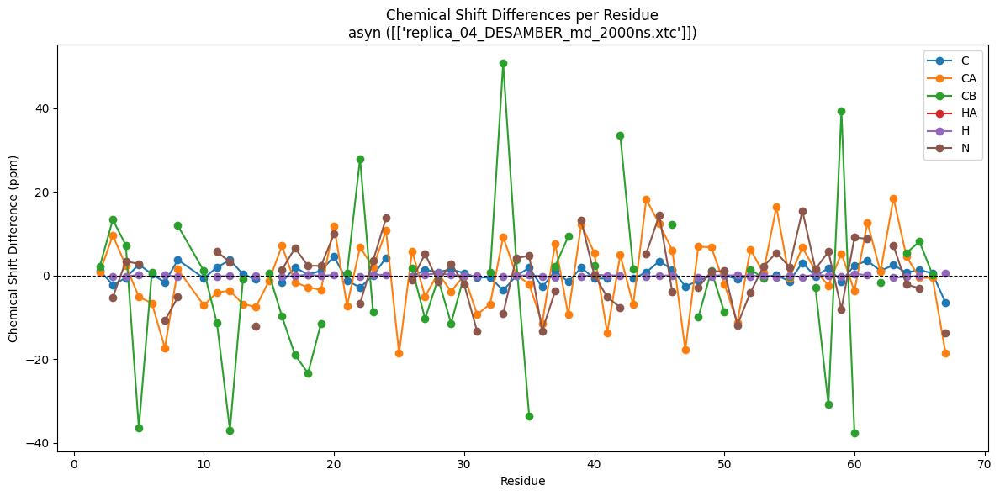

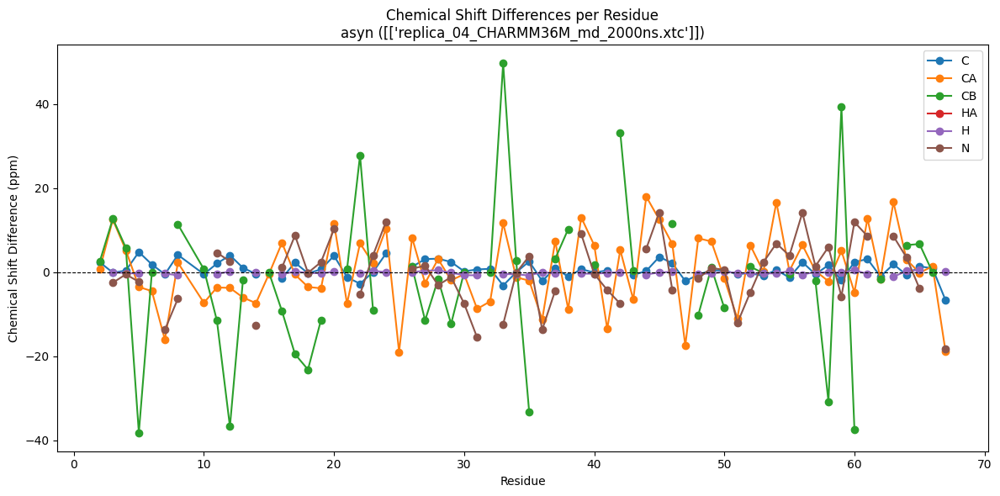

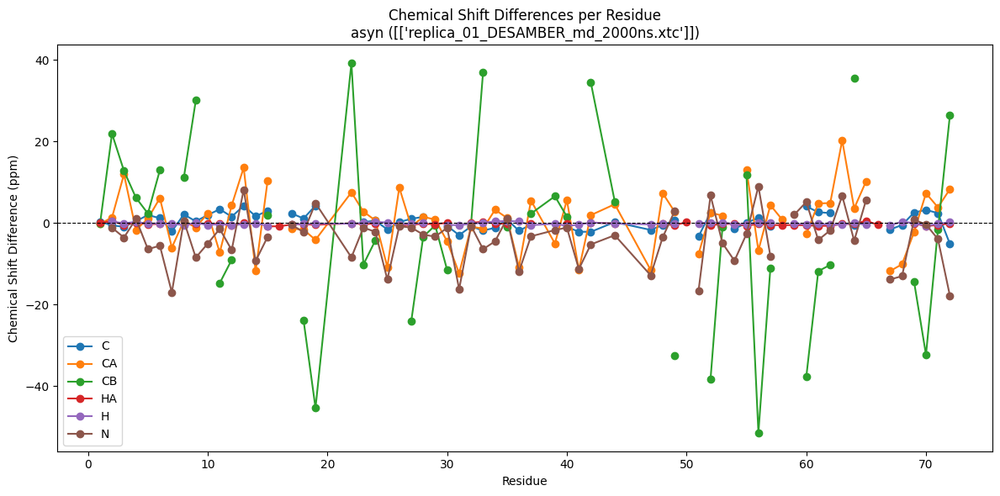

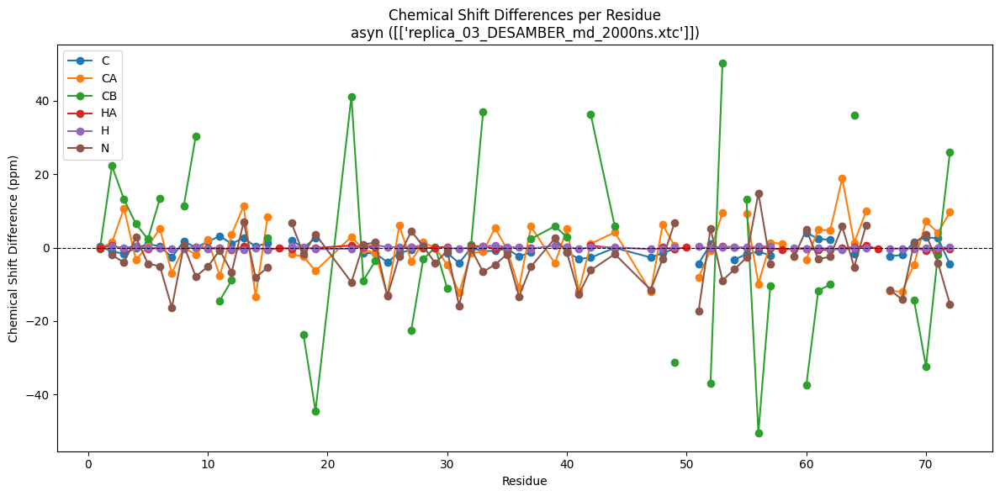

...

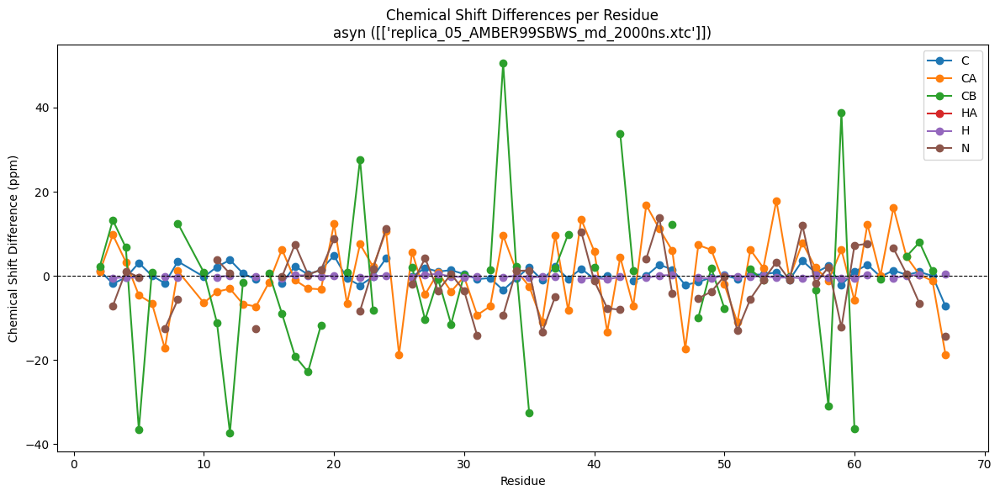

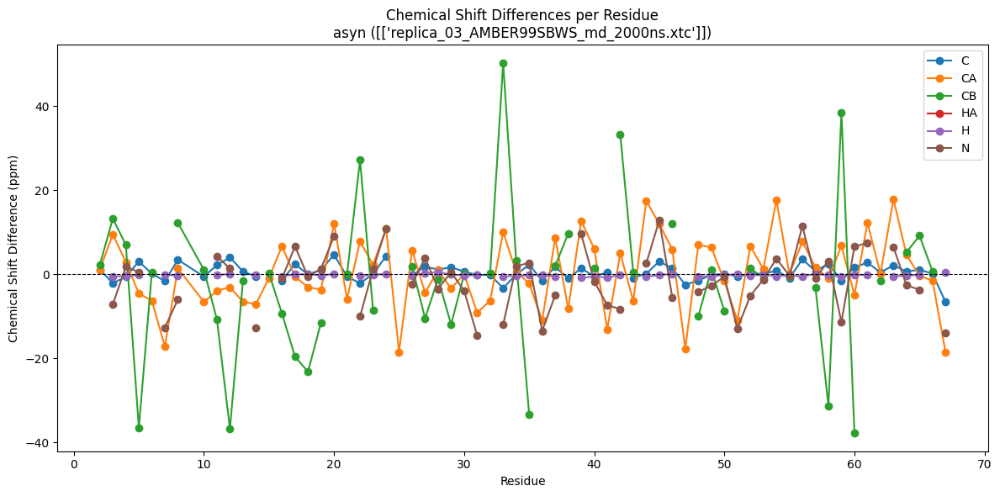

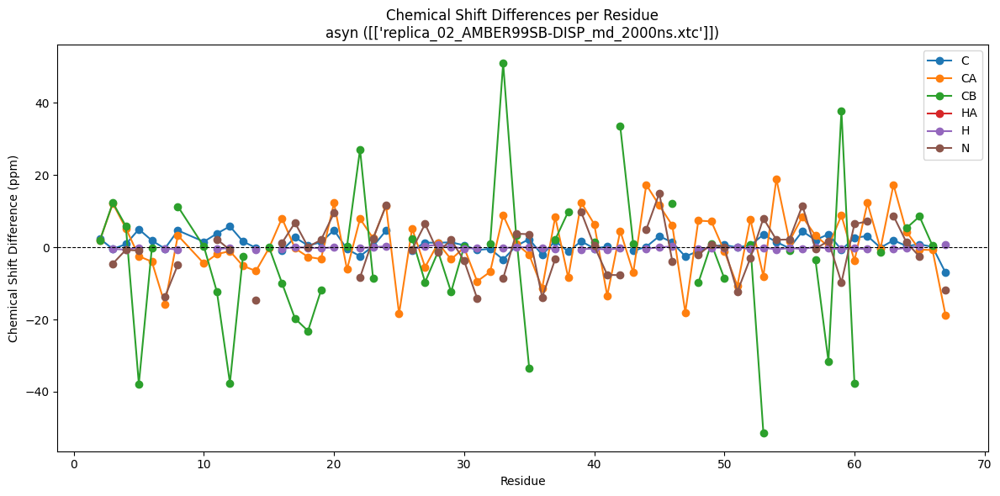

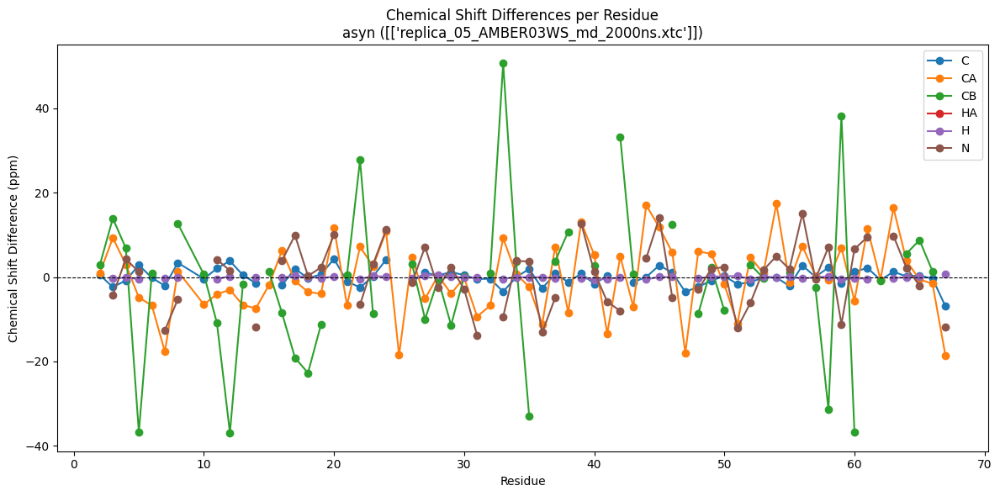

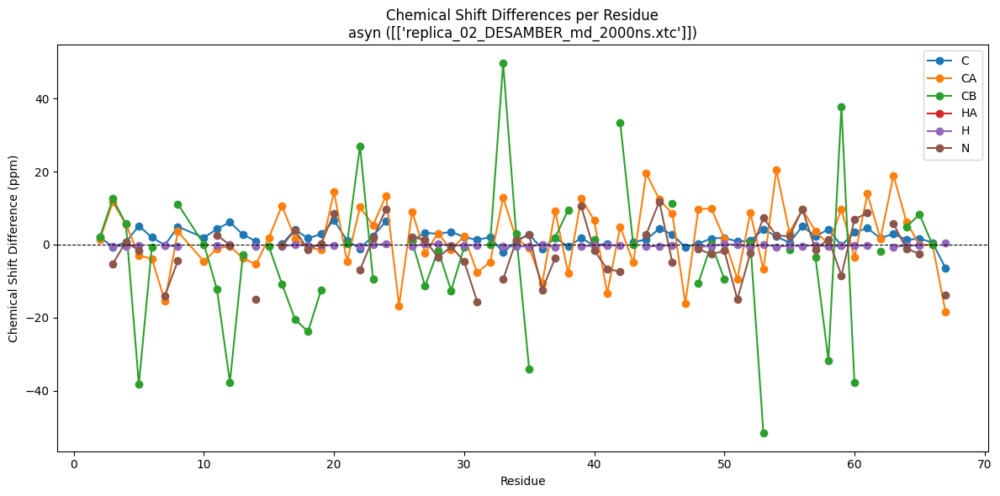

In [73]:
import yaml
import pandas as pd
import matplotlib.pyplot as plt

#IDs = [46, 38,25,14]#, 1, 48, 25, 14]

atom_accuracies = {
    'C': 1.5,
    'CA': 1.0,
    'CB': 1.3,
    'H': 0.55,
    'HA': 0.3,
    'N': 2.5
}

for system in systems:
    if system['ID'] in IDs:
        dataFolder = '../../Data/Simulations/' + system['path']
        chemical_shifts_file_rmsd = dataFolder + 'chemical_shift_rmsd.yaml'
        
        # Load chemical shift RMSD data
        with open(chemical_shifts_file_rmsd) as f:
            cs_rmsd = yaml.safe_load(f)
        
        # Convert to DataFrame (residues = rows, atoms = columns)
        df = pd.DataFrame(cs_rmsd['differences']).T
        df.index.name = "Residue"
        
        # Plot
        plt.figure(figsize=(12,6))
        for atom in df.columns:
            #accuracy = atom_accuracies[atom]
            #print(df.index, df[atom],atom)
            #print(df[atom],accuracy)
            #if df[atom] < accuracy:
            #plt.plot(df.index, df[atom], marker='o', markerfacecolor='none', label=atom)
            #else:
            plt.plot(df.index, df[atom], marker='o', label=atom)
            #for atom in atom_accuracies.keys():
            #    y = df[atom]
            #    x = df.index
            #    threshold = atom_accuracies[atom]
    
            #    # Separate points above/below threshold
            #    above = abs(y) >= threshold
            #    below = abs(y) < threshold

            #    # Plot above threshold (filled markers)
            #    plt.plot(x[above], y[above], marker='o', linestyle='-')

            #    # Plot below threshold (empty markers)
            #    plt.plot(x[below], y[below], marker='o', linestyle='-', 
            #        markerfacecolor='none',)


        plt.axhline(0, color='black', linestyle='--', linewidth=0.8)
        plt.title(f"Chemical Shift Differences per Residue\n{system['SYSTEM']} ({system['TRJ']})")
        plt.xlabel("Residue")
        plt.ylabel("Chemical Shift Difference (ppm)")
        plt.legend()
        plt.tight_layout()
        plt.show()


../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
Experimental residues: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
Example residue data: {1: {'HA': 4.11, 'C': 172.33, 'CA': 55.1, 'CB': 33.02}, 2: {'HA': 4.73, 'C': 175.84, 'CA': 54.27, 'CB': 41.52, 'N': 124.84}, 3: {'H': 8.35, 'HA': 4.04, 'C': 175.91, 'CA': 62.51, 'CB': 32.62, 'N': 120.59}, 4: {'H': 8.43, 'HA': 4.62, 'C': 175.85, 'CA': 57.98, 'CB': 39.39, 'N': 123.73}, 5: {'H': 8.27, 'HA': 4.33, 'C': 176.03, 'CA': 55.67, 'CB': 31.96, 'N': 122.5}}


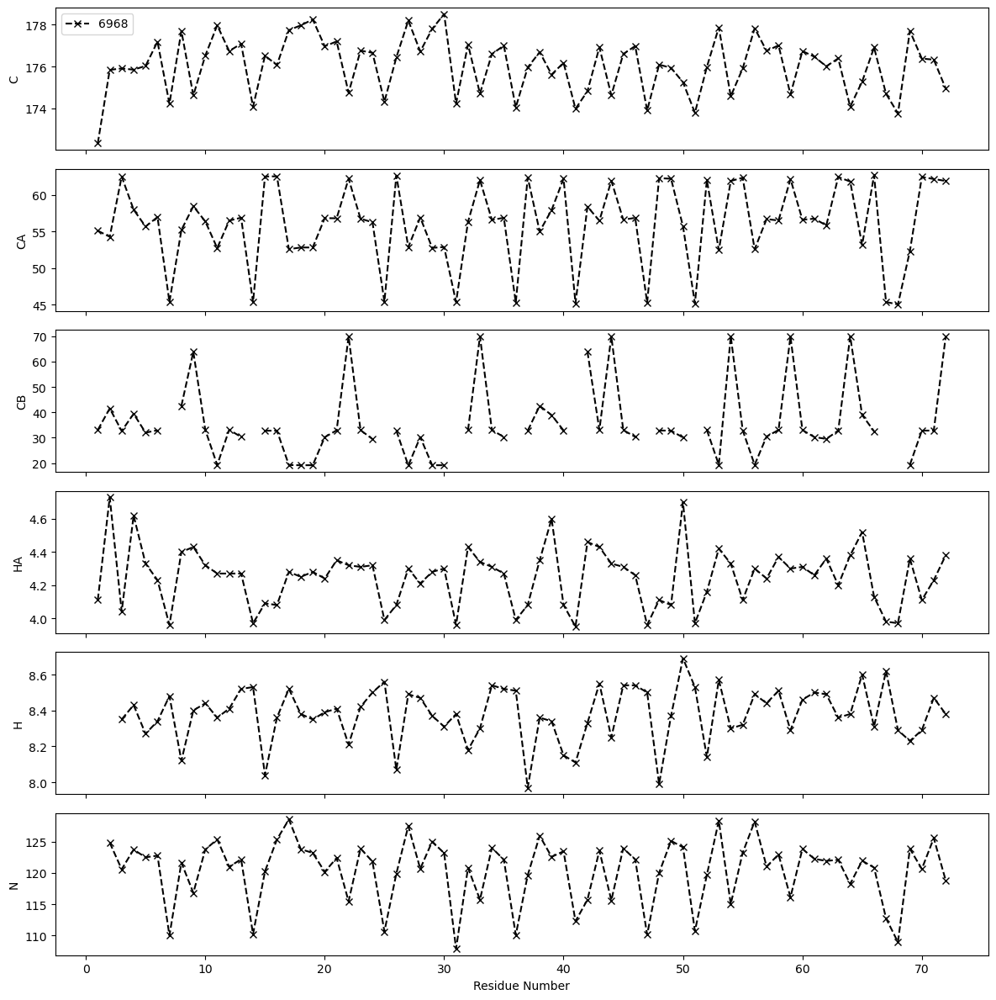

../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
Experimental residues: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
Example residue data: {2: {'CA': 54.2, 'CB': 41.4}, 3: {'H': 8.33, 'CA': 62.5, 'CB': 32.6, 'N': 120.6}, 4: {'H': 8.42, 'CA': 58.1, 'CB': 39.2, 'N': 123.8}, 5: {'H': 8.28, 'CA': 55.3, 'CB': 32.6, 'N': 122.7}, 6: {'H': 8.35, 'CA': 56.8, 'CB': 32.9, 'N': 122.9}}


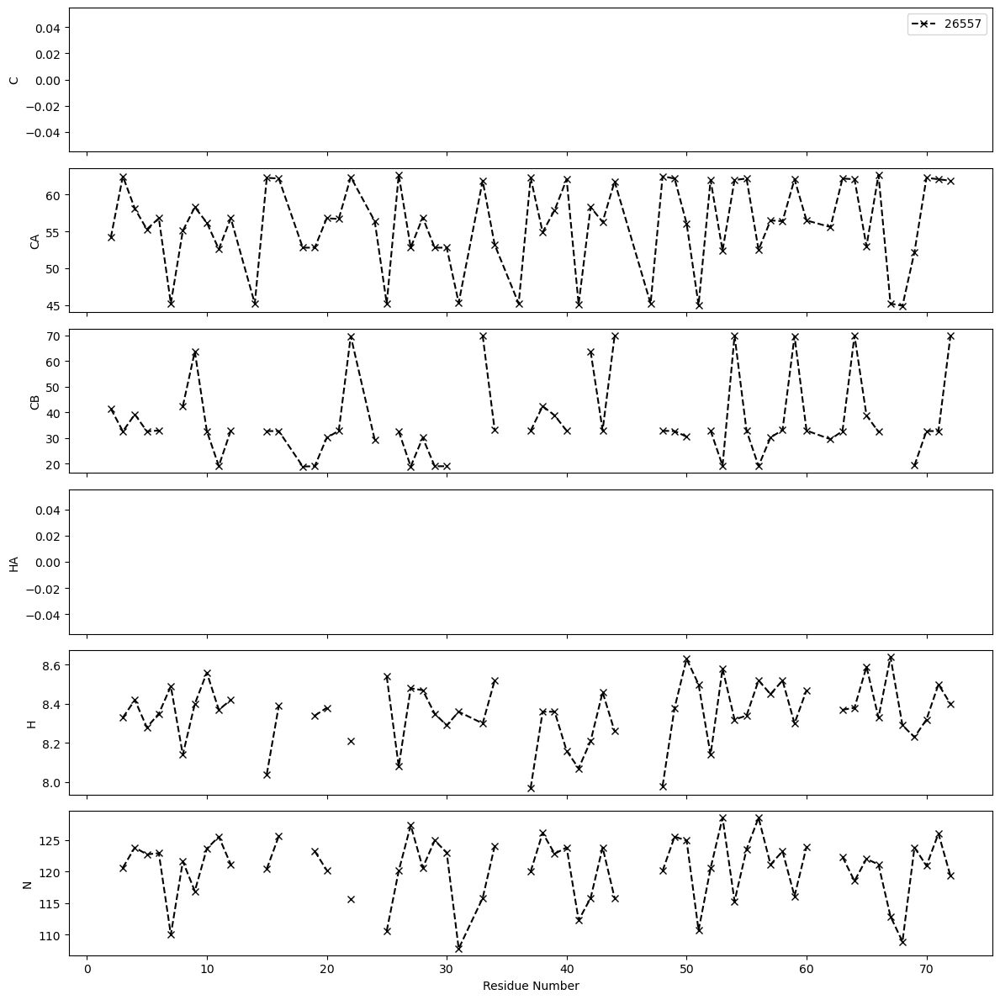

../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
Experimental residues: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
Example residue data: {3: {'H': 8.161, 'N': 120.075}, 4: {'H': 8.26, 'N': 123.168}, 5: {'H': 8.149, 'N': 121.966}, 6: {'H': 8.201, 'N': 122.332}, 7: {'H': 8.364, 'N': 109.671}}


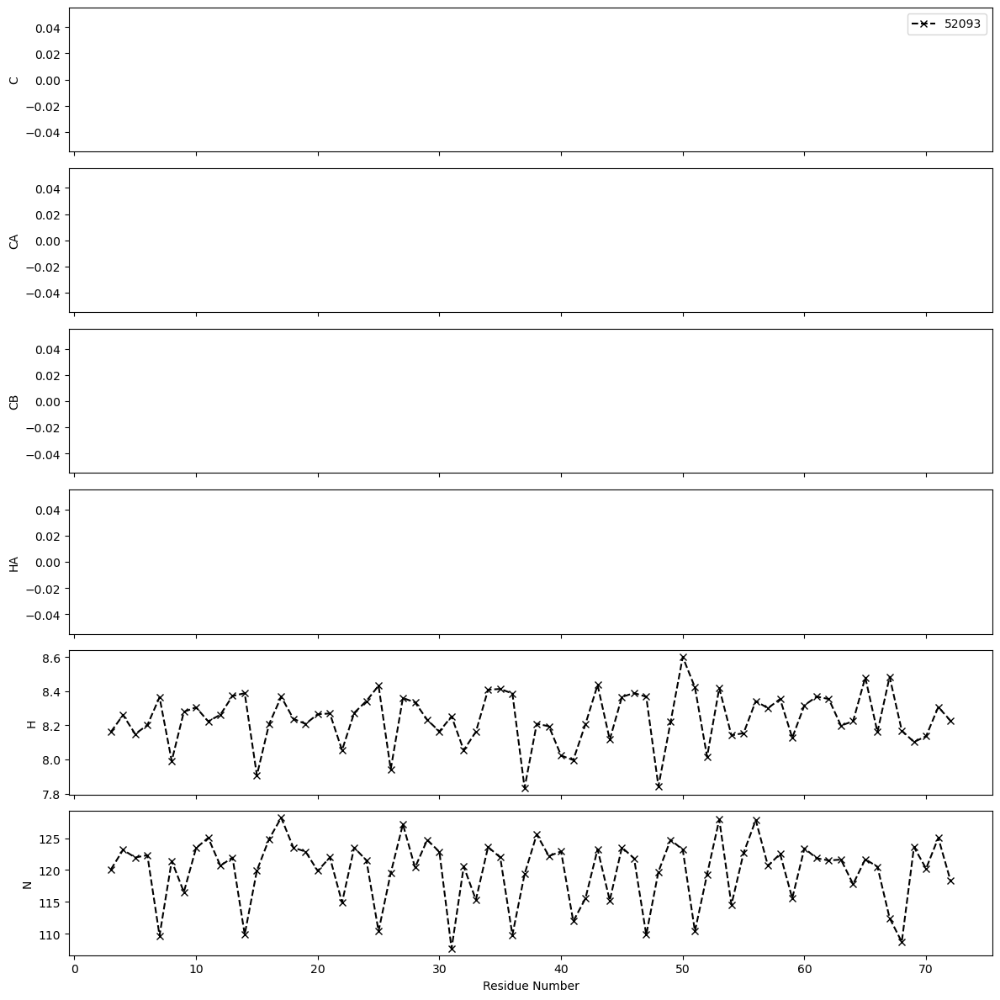

../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
Experimental residues: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
Example residue data: {3: {'H': 8.236, 'C': 176.026, 'CA': 62.157, 'CB': 31.469, 'N': 120.839}, 4: {'H': 8.342, 'C': 175.906, 'CA': 57.641, 'CB': 38.549, 'N': 123.864}, 5: {'H': 8.23, 'C': 176.026, 'CA': 55.023, 'CB': 31.469, 'N': 122.745}, 6: {'H': 8.282, 'C': 177.223, 'CA': 56.519, 'CB': 31.682, 'N': 123.066}, 7: {'H': 8.409, 'C': 174.13, 'CA': 44.843, 'N': 110.321}}


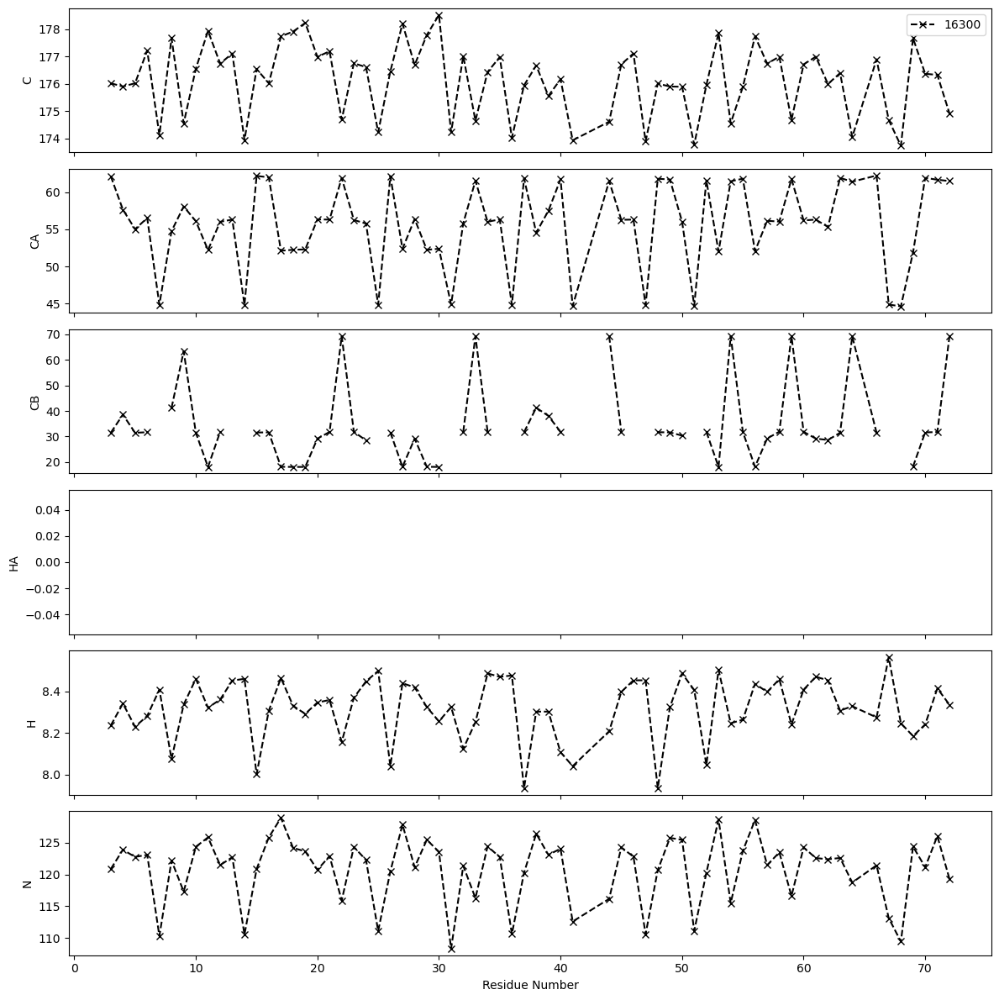

../../Data/Experiments/chemical_shift/BMRBid51152/bmr51152.str
Experimental residues: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
Example residue data: {2: {'C': 173.229, 'CA': 51.821, 'CB': 39.226}, 3: {'H': 8.219, 'C': 173.248, 'CA': 60.096, 'CB': 30.249, 'N': 116.676}, 4: {'H': 8.321, 'C': 173.277, 'CA': 55.404, 'CB': 36.994, 'N': 119.742}, 5: {'H': 8.233, 'C': 173.37, 'CA': 53.094, 'CB': 30.615, 'N': 118.58}, 6: {'H': 8.25, 'C': 174.476, 'CA': 54.393, 'CB': 30.453, 'N': 118.921}}


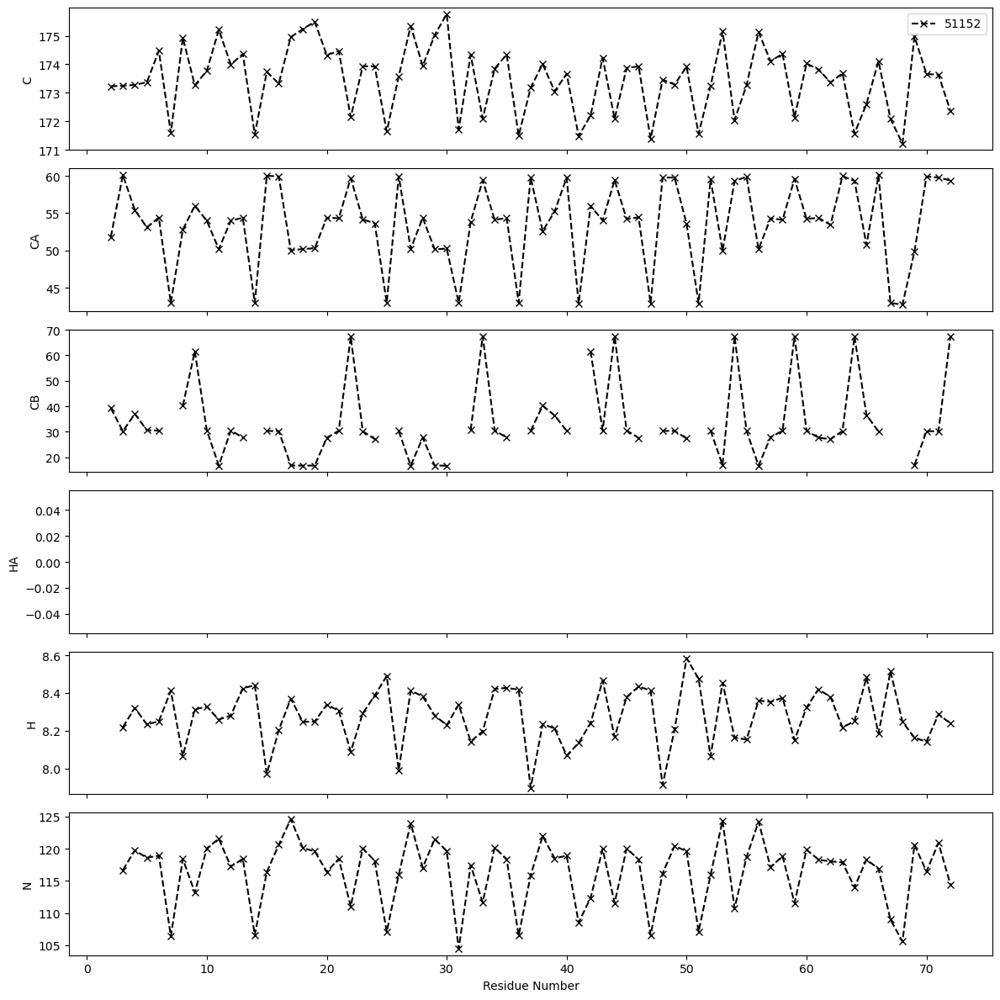

../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
Experimental residues: [2, 3, 7, 8, 9, 10, 11, 12, 14, 15]
Example residue data: {2: {'C': 175.9182}, 3: {'H': 8.3768, 'N': 120.7082}, 7: {'C': 174.2049}, 8: {'H': 8.1989, 'C': 177.794, 'N': 122.1472}, 9: {'H': 8.451, 'C': 174.613, 'N': 116.9963}}


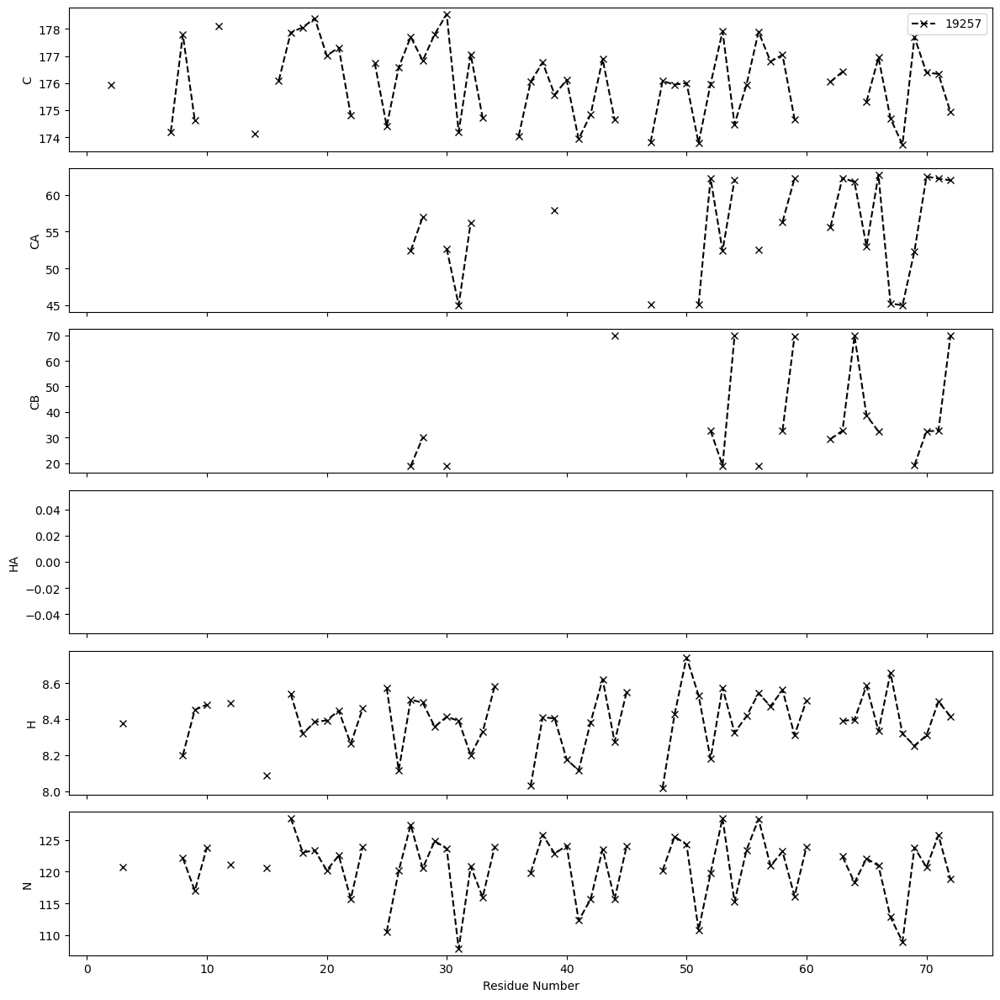

../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str
Experimental residues: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
Example residue data: {3: {'H': 8.217, 'N': 120.284}, 4: {'H': 8.297, 'N': 123.272}, 5: {'H': 8.177, 'N': 122.154}, 6: {'H': 8.22, 'N': 122.46}, 7: {'H': 8.364, 'N': 109.671}}


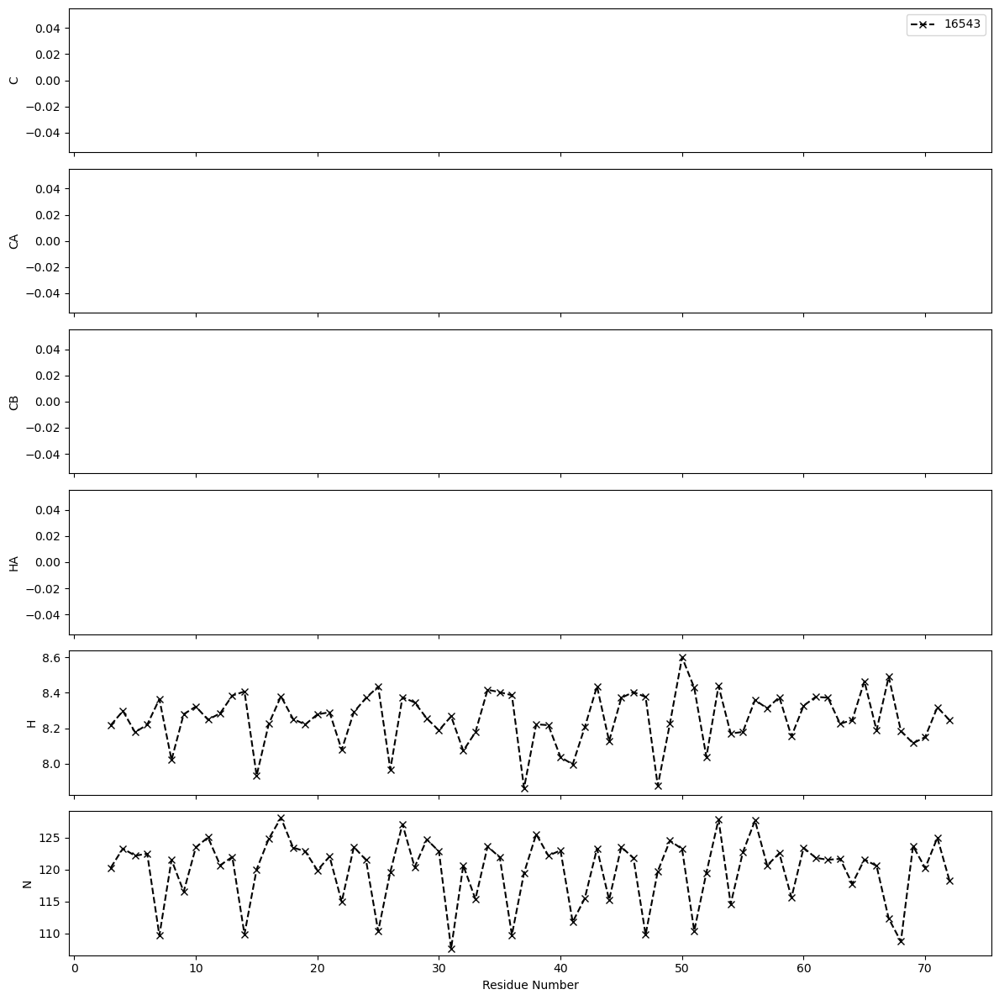

In [29]:

colors = ["red", "blue", "green", "purple", "orange", "brown"]
nuclei = ["C", "CA", "CB", "HA", "H", "N"]

asyn_bmrbs = [6968, 26557, 52093, 16300, 51152, 19257, 16543]

for BMRBid in asyn_bmrbs:
    exp_data_path = '../../Data/Experiments/chemical_shift/BMRBid' + str(BMRBid)
    bmrb_local_file = exp_data_path + "/bmr" + str(BMRBid) + ".str"

    exp_data = parse_star_file(bmrb_local_file)
    # Filter to simulation residues

    print(bmrb_local_file)

    exp_data_filtered = {res: atoms for res, atoms in exp_data.items() if res in sim_residues_all}
    exp_residues = sorted(exp_data_filtered.keys())

    print("Experimental residues:", exp_residues[:10])
    print("Example residue data:", {r: exp_data_filtered[r] for r in exp_residues[:5]})

    # ------------------------
    # 4. Plotting
    # ------------------------
    fig, axs = plt.subplots(len(nuclei), 1, figsize=(12, 12), sharex=True)

    # Simulated data
    #for file_idx, filename in enumerate(files):
    #    with open(filename, "r") as f:
    #        raw = yaml.safe_load(f)
    #    sim_data = {int(k): v for k, v in raw.items()}
    #    residues = sorted(sim_data.keys())

    #    for ax, nucleus in zip(axs, nuclei):
    #        values = [sim_data.get(r, {}).get(nucleus, math.nan) for r in residues]
    #        ax.plot(
    #            residues,
    #            values,
    #            marker="o",
    #            linewidth=1,
    #            #label=os.path.basename(filename).replace(".yaml", ""),
    #            color=colors[file_idx % len(colors)]
    #        )
    #        ax.set_ylabel(nucleus)
    #        ax.set_title(f"{nucleus} Chemical Shifts")
    #        ax.grid(True, linestyle="--", alpha=0.6)

    # Experimental data overlay
    for ax, nucleus in zip(axs, nuclei):
        vals_exp = [exp_data_filtered.get(r, {}).get(nucleus, math.nan) for r in exp_residues]
        ax.plot(
            exp_residues,
            vals_exp,
            marker="x",
            linestyle="--",
            color="black",
            label=BMRBid
        )
        ax.set_ylabel(nucleus)

    axs[-1].set_xlabel("Residue Number")
    axs[0].legend()
    plt.tight_layout()
    plt.show()


../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
Experimental residues: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
Example residue data: {1: {'HA': 4.11, 'C': 172.33, 'CA': 55.1, 'CB': 33.02}, 2: {'HA': 4.73, 'C': 175.84, 'CA': 54.27, 'CB': 41.52, 'N': 124.84}, 3: {'H': 8.35, 'HA': 4.04, 'C': 175.91, 'CA': 62.51, 'CB': 32.62, 'N': 120.59}, 4: {'H': 8.43, 'HA': 4.62, 'C': 175.85, 'CA': 57.98, 'CB': 39.39, 'N': 123.73}, 5: {'H': 8.27, 'HA': 4.33, 'C': 176.03, 'CA': 55.67, 'CB': 31.96, 'N': 122.5}}


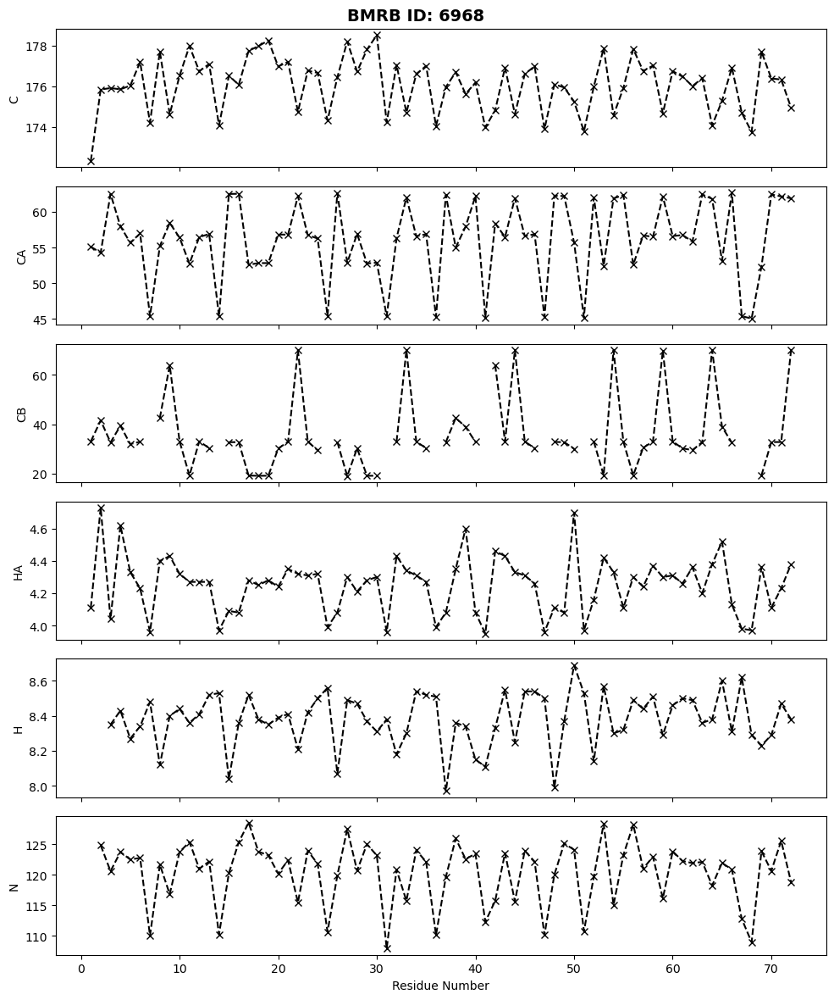

../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
Experimental residues: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
Example residue data: {2: {'CA': 54.2, 'CB': 41.4}, 3: {'H': 8.33, 'CA': 62.5, 'CB': 32.6, 'N': 120.6}, 4: {'H': 8.42, 'CA': 58.1, 'CB': 39.2, 'N': 123.8}, 5: {'H': 8.28, 'CA': 55.3, 'CB': 32.6, 'N': 122.7}, 6: {'H': 8.35, 'CA': 56.8, 'CB': 32.9, 'N': 122.9}}


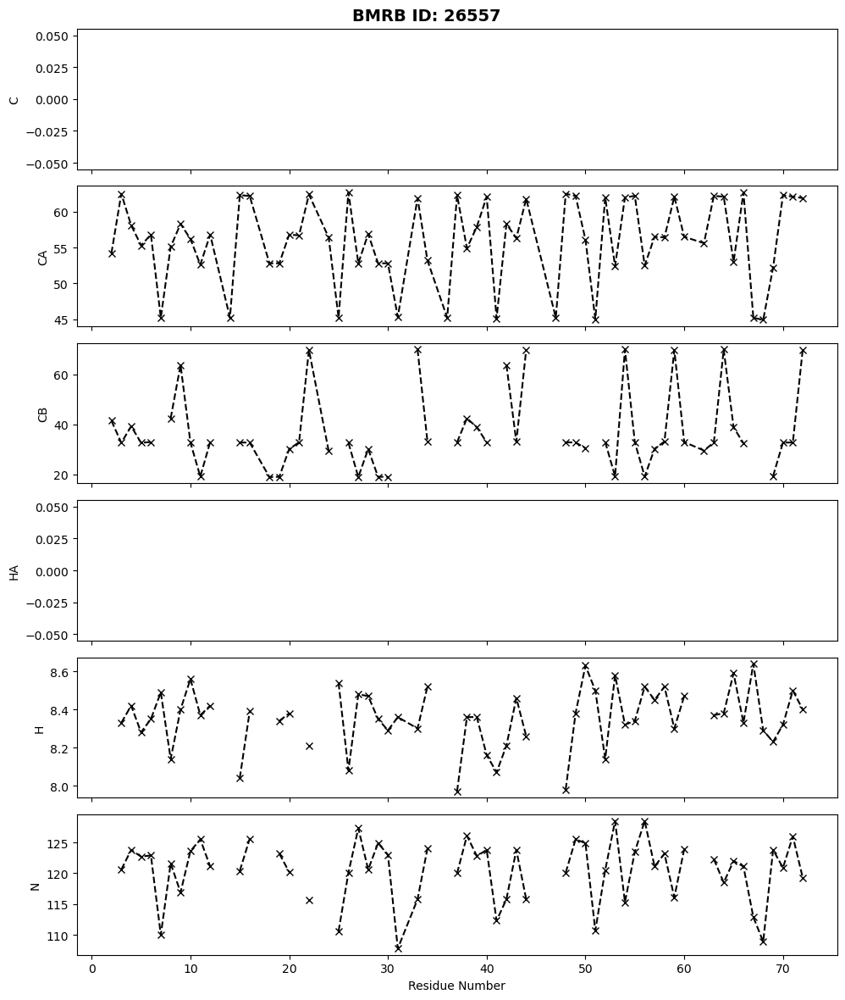

../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
Experimental residues: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
Example residue data: {3: {'H': 8.161, 'N': 120.075}, 4: {'H': 8.26, 'N': 123.168}, 5: {'H': 8.149, 'N': 121.966}, 6: {'H': 8.201, 'N': 122.332}, 7: {'H': 8.364, 'N': 109.671}}


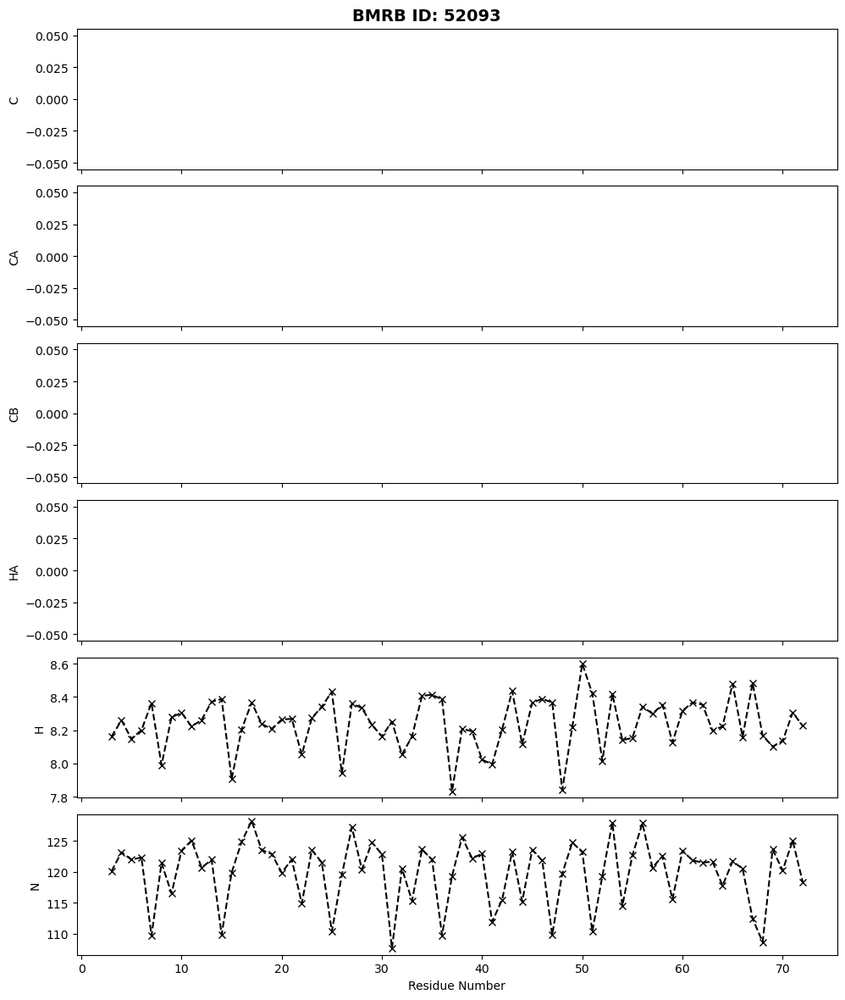

../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
Experimental residues: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
Example residue data: {3: {'H': 8.236, 'C': 176.026, 'CA': 62.157, 'CB': 31.469, 'N': 120.839}, 4: {'H': 8.342, 'C': 175.906, 'CA': 57.641, 'CB': 38.549, 'N': 123.864}, 5: {'H': 8.23, 'C': 176.026, 'CA': 55.023, 'CB': 31.469, 'N': 122.745}, 6: {'H': 8.282, 'C': 177.223, 'CA': 56.519, 'CB': 31.682, 'N': 123.066}, 7: {'H': 8.409, 'C': 174.13, 'CA': 44.843, 'N': 110.321}}


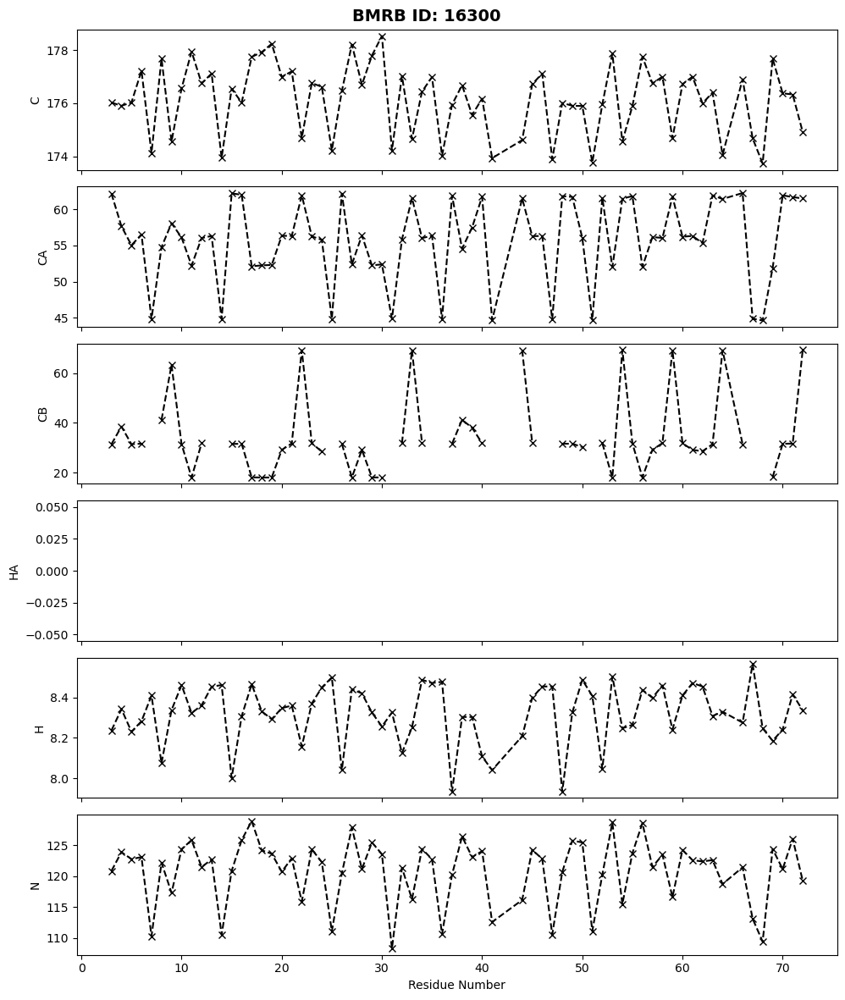

../../Data/Experiments/chemical_shift/BMRBid51152/bmr51152.str
Experimental residues: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
Example residue data: {2: {'C': 173.229, 'CA': 51.821, 'CB': 39.226}, 3: {'H': 8.219, 'C': 173.248, 'CA': 60.096, 'CB': 30.249, 'N': 116.676}, 4: {'H': 8.321, 'C': 173.277, 'CA': 55.404, 'CB': 36.994, 'N': 119.742}, 5: {'H': 8.233, 'C': 173.37, 'CA': 53.094, 'CB': 30.615, 'N': 118.58}, 6: {'H': 8.25, 'C': 174.476, 'CA': 54.393, 'CB': 30.453, 'N': 118.921}}


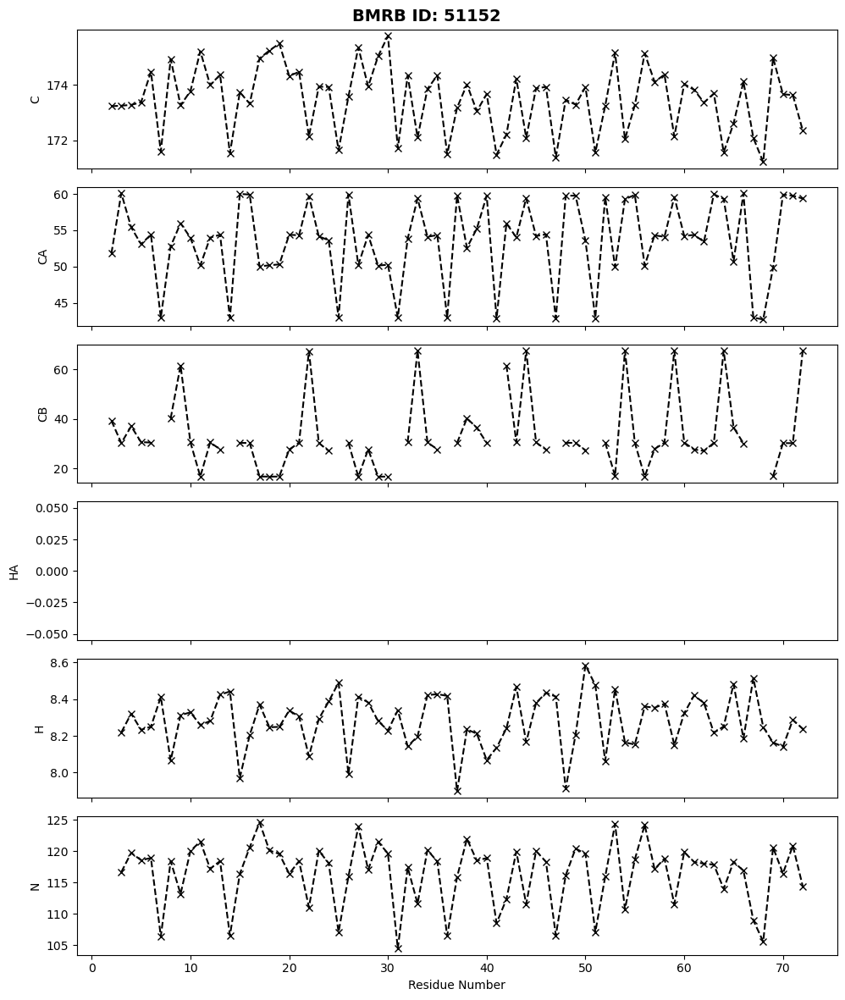

../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
Experimental residues: [2, 3, 7, 8, 9, 10, 11, 12, 14, 15]
Example residue data: {2: {'C': 175.9182}, 3: {'H': 8.3768, 'N': 120.7082}, 7: {'C': 174.2049}, 8: {'H': 8.1989, 'C': 177.794, 'N': 122.1472}, 9: {'H': 8.451, 'C': 174.613, 'N': 116.9963}}


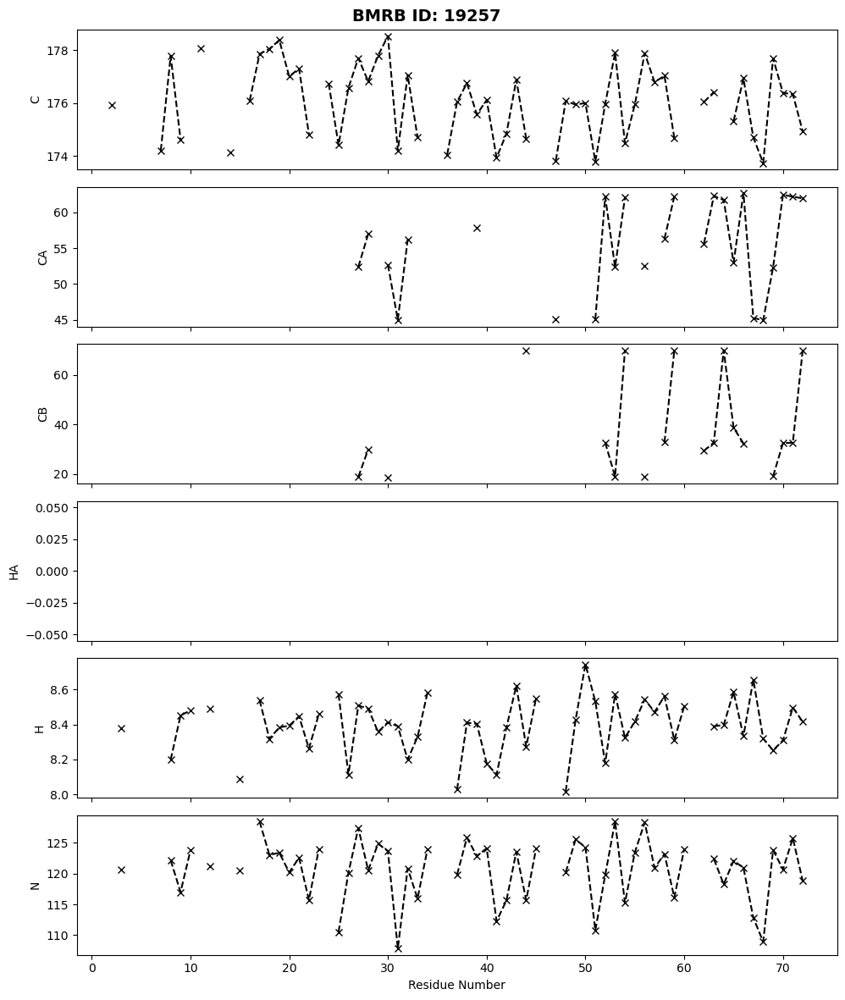

../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str
Experimental residues: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
Example residue data: {3: {'H': 8.217, 'N': 120.284}, 4: {'H': 8.297, 'N': 123.272}, 5: {'H': 8.177, 'N': 122.154}, 6: {'H': 8.22, 'N': 122.46}, 7: {'H': 8.364, 'N': 109.671}}


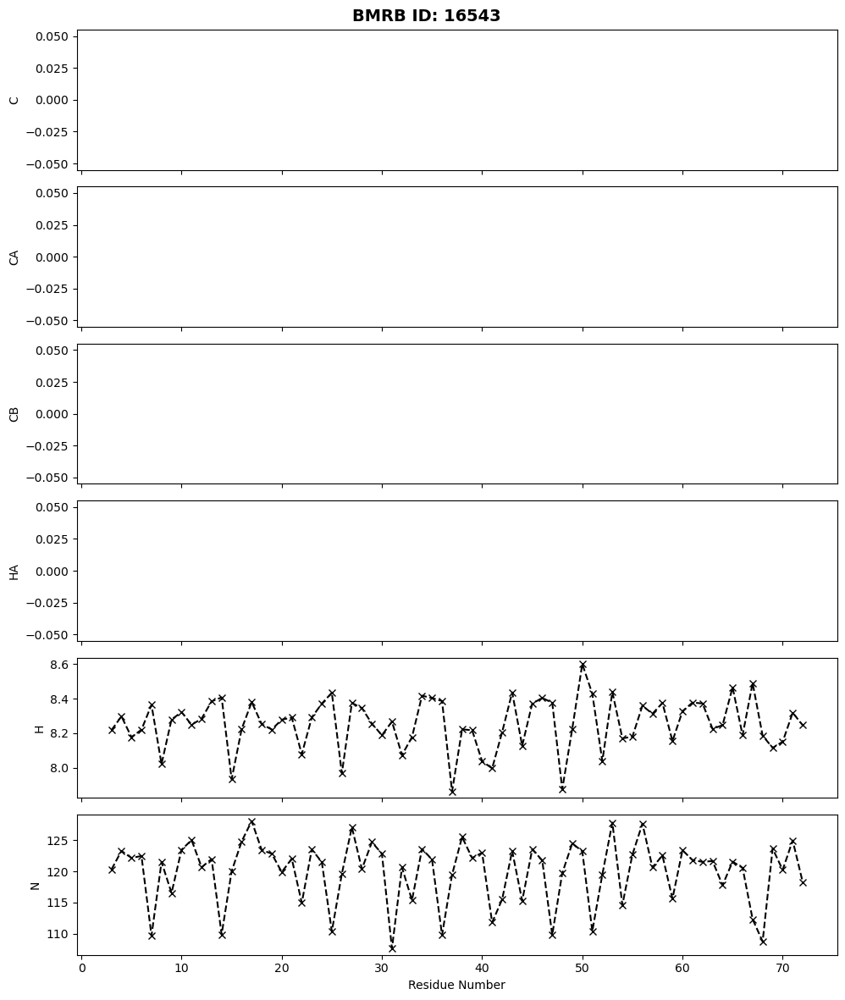

In [30]:
colors = ["red", "blue", "green", "purple", "orange", "brown"]
nuclei = ["C", "CA", "CB", "HA", "H", "N"]
asyn_bmrbs = [6968, 26557, 52093, 16300, 51152, 19257, 16543]

for BMRBid in asyn_bmrbs:
    exp_data_path = '../../Data/Experiments/chemical_shift/BMRBid' + str(BMRBid)
    bmrb_local_file = exp_data_path + "/bmr" + str(BMRBid) + ".str"
    exp_data = parse_star_file(bmrb_local_file)
    
    # Filter to simulation residues
    print(bmrb_local_file)
    exp_data_filtered = {res: atoms for res, atoms in exp_data.items() if res in sim_residues_all}
    exp_residues = sorted(exp_data_filtered.keys())
    print("Experimental residues:", exp_residues[:10])
    print("Example residue data:", {r: exp_data_filtered[r] for r in exp_residues[:5]})
    
    # Create a new figure for each BMRB ID
    fig, axs = plt.subplots(len(nuclei), 1, figsize=(10, 12), sharex=True)
    fig.suptitle(f'BMRB ID: {BMRBid}', fontsize=14, fontweight='bold')
    
    for ax, nucleus in zip(axs, nuclei):
        vals_exp = [exp_data_filtered.get(r, {}).get(nucleus, math.nan) for r in exp_residues]
        ax.plot(
            exp_residues,
            vals_exp,
            marker="x",
            linestyle="--",
            color="black"
        )
        ax.set_ylabel(nucleus)
    
    axs[-1].set_xlabel("Residue Number")
    plt.tight_layout()
    plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '../../Data/Experiments/chemical_shift/BMRBid10.1038/s41467-025-64098-3/bmr10.1038/s41467-025-64098-3.str'

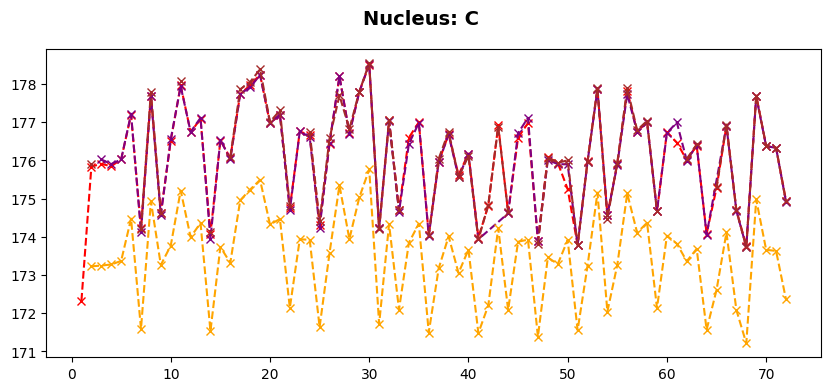

In [7]:
colors = ["red", "blue", "green", "purple", "orange", "brown"]
nuclei = ["C", "CA", "CB", "HA", "H", "N"]
asyn_bmrbs = [6968, 26557, 52093, 16300, 51152, 19257, 16543, '10.1038/s41467-025-64098-3']

# Create a figure for each nucleus
for nucleus in nuclei:
    fig, ax = plt.subplots(1, 1, figsize=(10, 4))
    fig.suptitle(f'Nucleus: {nucleus}', fontsize=14, fontweight='bold')
    
    # Plot all BMRB IDs on this nucleus subplot
    for i, BMRBid in enumerate(asyn_bmrbs):
        try:
            exp_data_path = '../../Data/Experiments/chemical_shift/BMRBid' + str(BMRBid)
        except:
            exp_data_path = '../../Data/Experiments/chemical_shift/' + str(BMRBid)
        bmrb_local_file = exp_data_path + "/bmr" + str(BMRBid) + ".str"
        exp_data = parse_star_file(bmrb_local_file)
        
        # Filter to simulation residues
        #print(bmrb_local_file)
        exp_data_filtered = {res: atoms for res, atoms in exp_data.items() if res in sim_residues_all}
        exp_residues = sorted(exp_data_filtered.keys())
        #print("Experimental residues:", exp_residues[:10])
        #print("Example residue data:", {r: exp_data_filtered[r] for r in exp_residues[:5]})
        
        vals_exp = [exp_data_filtered.get(r, {}).get(nucleus, math.nan) for r in exp_residues]
        color = colors[i % len(colors)]
        ax.plot(
            exp_residues,
            vals_exp,
            marker="x",
            linestyle="--",
            color=color,
            label=f'BMRB {BMRBid}'
        )
    
    ax.set_ylabel(f'{nucleus} Chemical Shift')
    ax.set_xlabel("Residue Number")
    ax.legend()
    plt.tight_layout()
    plt.show()

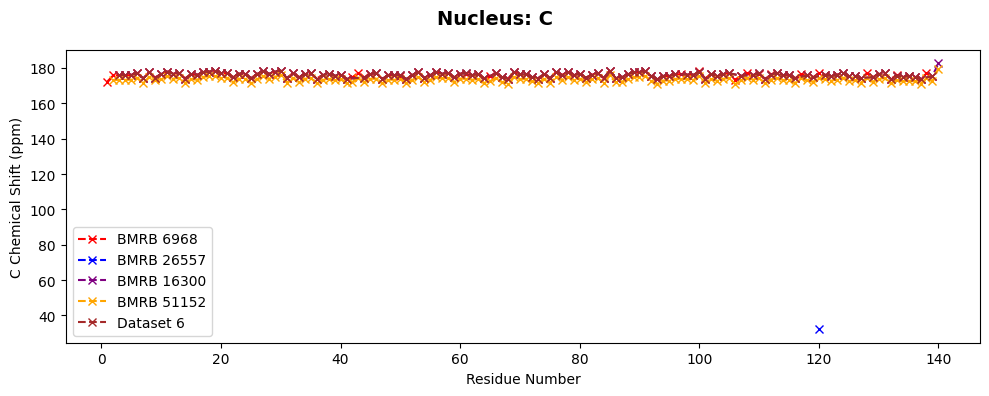

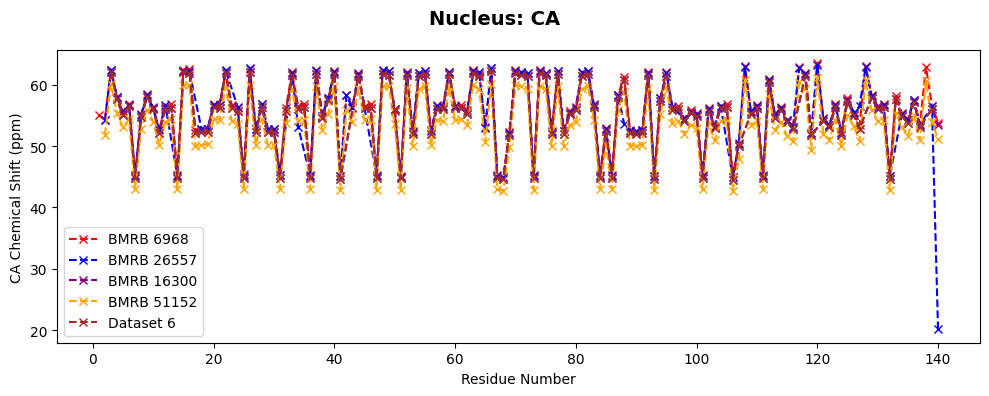

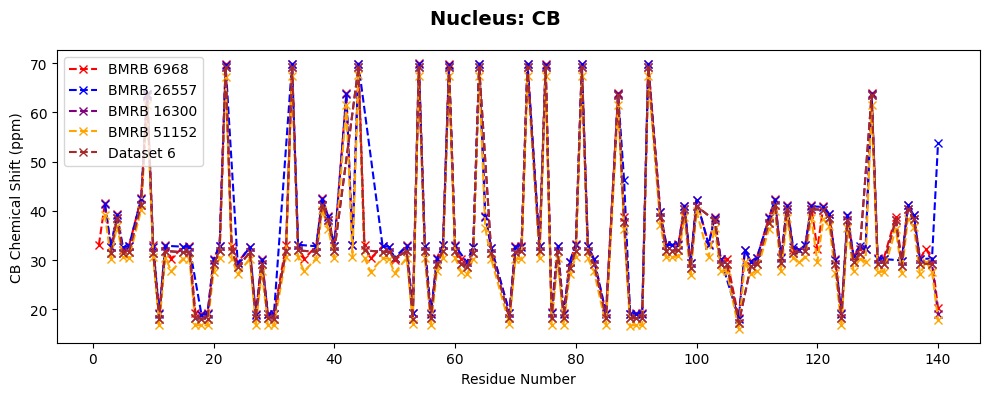

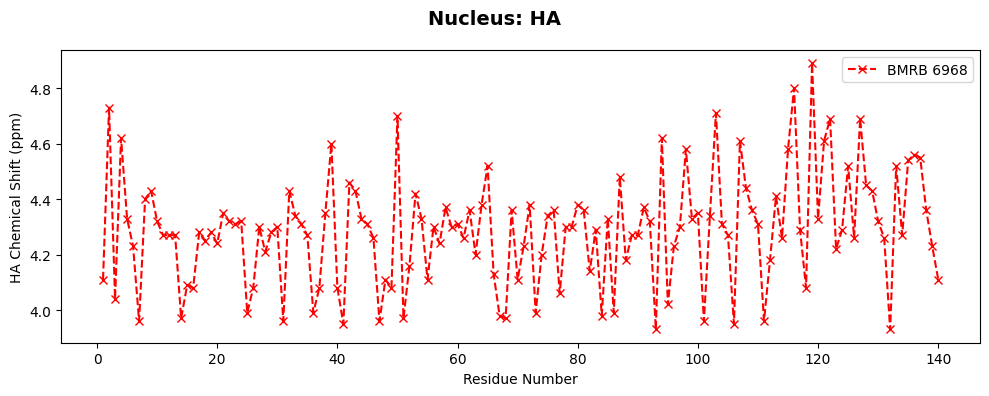

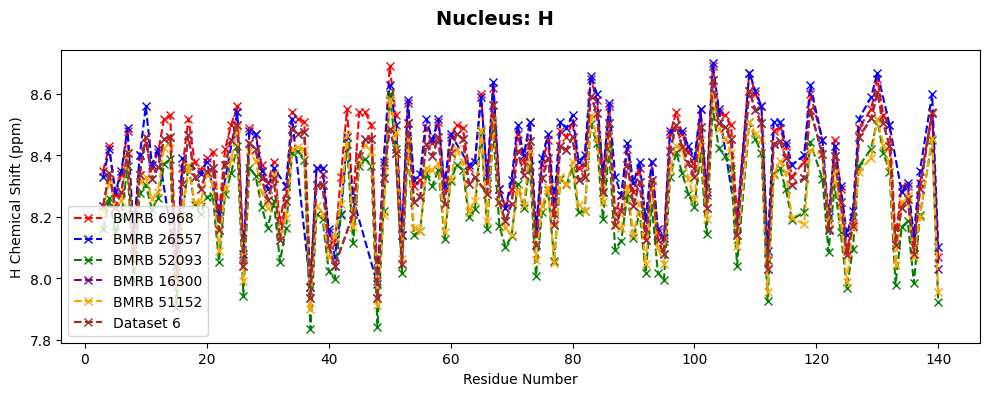

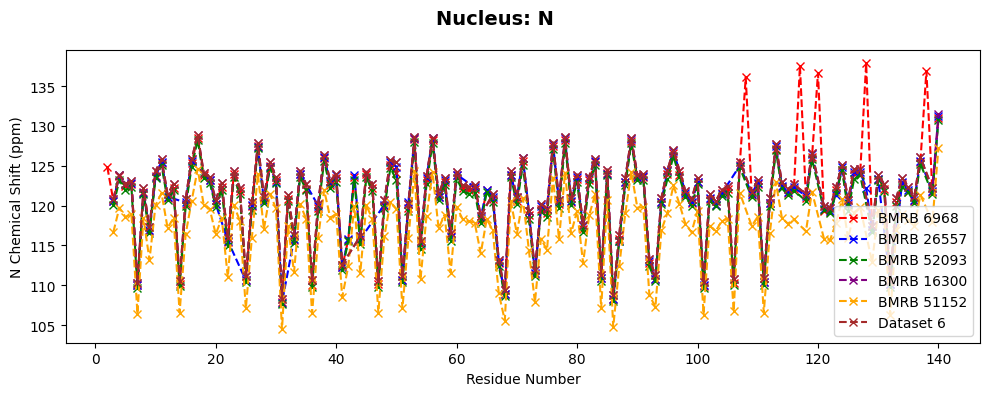

In [12]:
import matplotlib.pyplot as plt
import math
import os

# --- CONFIGURATION ---
colors = ["red", "blue", "green", "purple", "orange", "brown"]
nuclei = ["C", "CA", "CB", "HA", "H", "N"]

# Replace these paths with your actual output.txt file paths
# These can be generated from different BMRB IDs, models, or conditions
output_files = [
    "../../Data/Experiments/chemical_shift/BMRBid6968/chemical_shifts.yaml",
    "../../Data/Experiments/chemical_shift/BMRBid26557/chemical_shifts.yaml",
    "../../Data/Experiments/chemical_shift/BMRBid52093/chemical_shifts.yaml",
    "../../Data/Experiments/chemical_shift/BMRBid16300/chemical_shifts.yaml",
    "../../Data/Experiments/chemical_shift/BMRBid51152/chemical_shifts.yaml",
    "../../Data/Experiments/chemical_shift/10.1038/s41467-025-64098-3/chemical_shifts.yaml",
]
labels = [
    "BMRB 6968",
    "BMRB 26557",
    "BMRB 52093",
    "BMRB 16300",
    "BMRB 51152",
]


# --- FUNCTION TO READ output.txt FORMAT ---
def read_shift_file(filename):
    residues = {}
    current_res = None
    with open(filename, "r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            if line.endswith(":") and not line.startswith("  "):
                # New residue block
                current_res = int(line[:-1])
                residues[current_res] = {}
            elif ":" in line and current_res is not None:
                nucleus, val = line.split(":")
                residues[current_res][nucleus.strip()] = float(val.strip())
    return residues


# --- LOAD ALL FILES ---
datasets = []
for fpath in output_files:
    if os.path.exists(fpath):
        datasets.append(read_shift_file(fpath))
    else:
        print(f"⚠️ Warning: file not found {fpath}")

# --- GET ALL RESIDUE NUMBERS ---
all_residues = sorted(
    set().union(*[data.keys() for data in datasets if isinstance(data, dict)])
)

# --- PLOTTING ---
for nucleus in nuclei:
    fig, ax = plt.subplots(1, 1, figsize=(10, 4))
    fig.suptitle(f"Nucleus: {nucleus}", fontsize=14, fontweight="bold")

    for i, data in enumerate(datasets):
        vals_exp = []
        filtered_residues = []

        for r in all_residues:
            val = data.get(r, {}).get(nucleus, math.nan)
            # ✅ Ignore zero or missing (NaN) values
            if val and not math.isnan(val) and val != 0.0:
                vals_exp.append(val)
                filtered_residues.append(r)

        color = colors[i % len(colors)]
        label = labels[i] if i < len(labels) else f"Dataset {i+1}"

        if vals_exp:  # only plot if there are valid points
            ax.plot(
                filtered_residues,
                vals_exp,
                marker="x",
                linestyle="--",
                color=color,
                label=label,
            )

    ax.set_ylabel(f"{nucleus} Chemical Shift (ppm)")
    ax.set_xlabel("Residue Number")
    ax.legend()
    plt.tight_layout()
    plt.show()



../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
../../Data/Experiments/chemical_shift/BMRBid51152/bmr51152.str
../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str


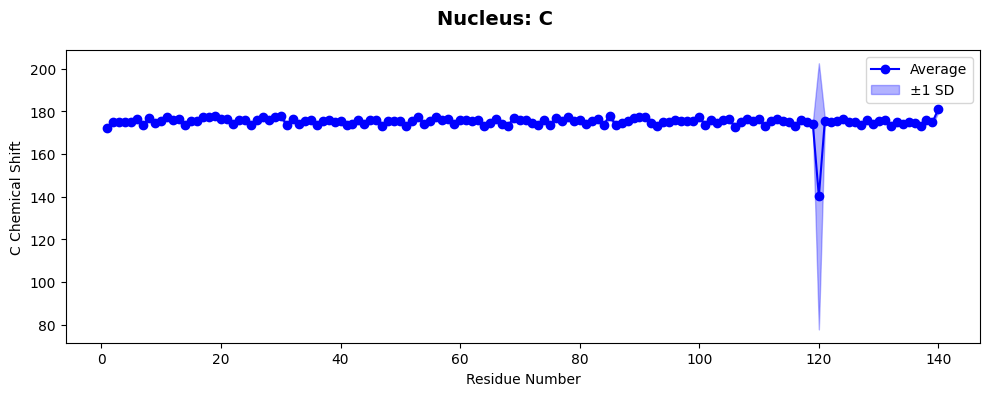

../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
../../Data/Experiments/chemical_shift/BMRBid51152/bmr51152.str
../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str


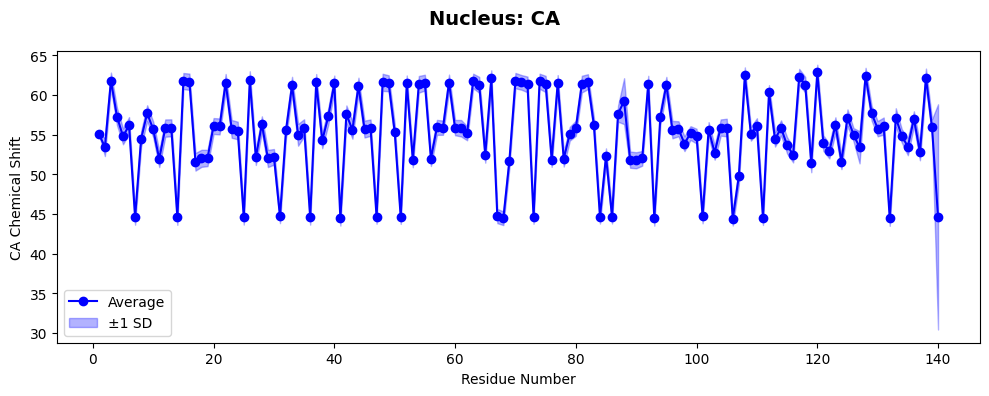

../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
../../Data/Experiments/chemical_shift/BMRBid51152/bmr51152.str
../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str


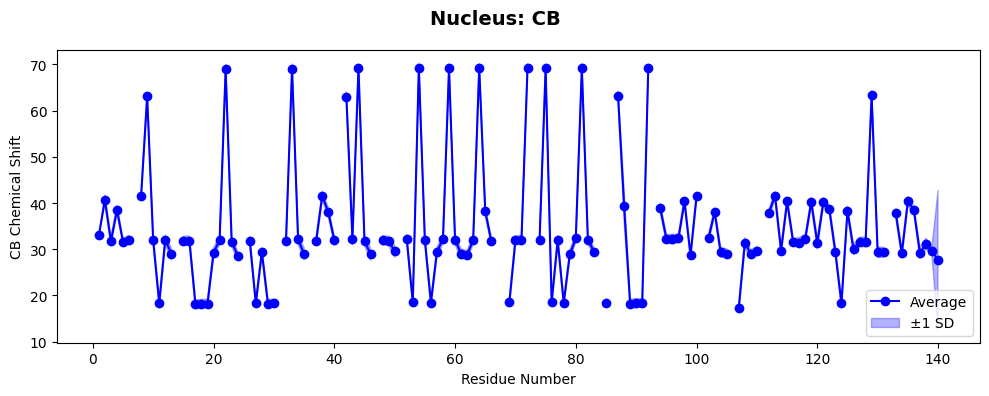

../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
../../Data/Experiments/chemical_shift/BMRBid51152/bmr51152.str
../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str


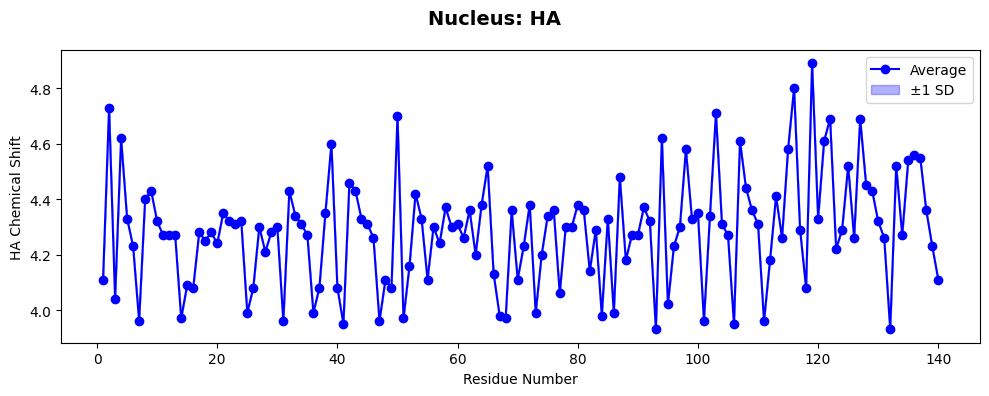

../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
../../Data/Experiments/chemical_shift/BMRBid51152/bmr51152.str
../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str


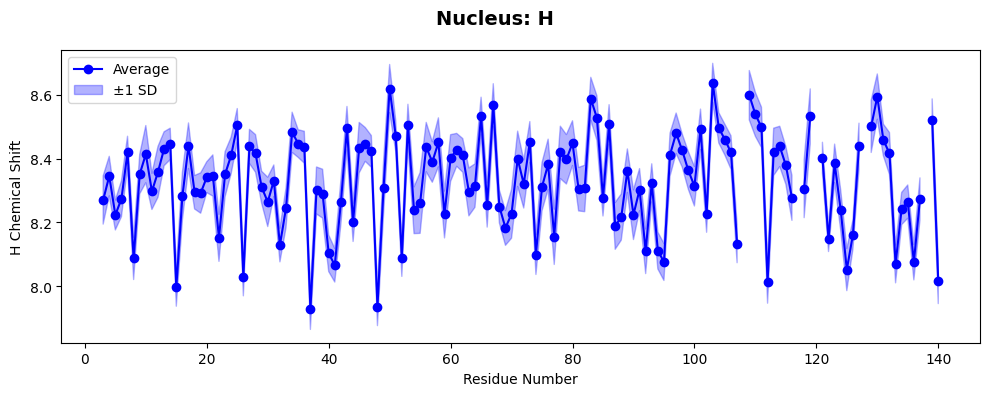

../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
../../Data/Experiments/chemical_shift/BMRBid51152/bmr51152.str
../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str


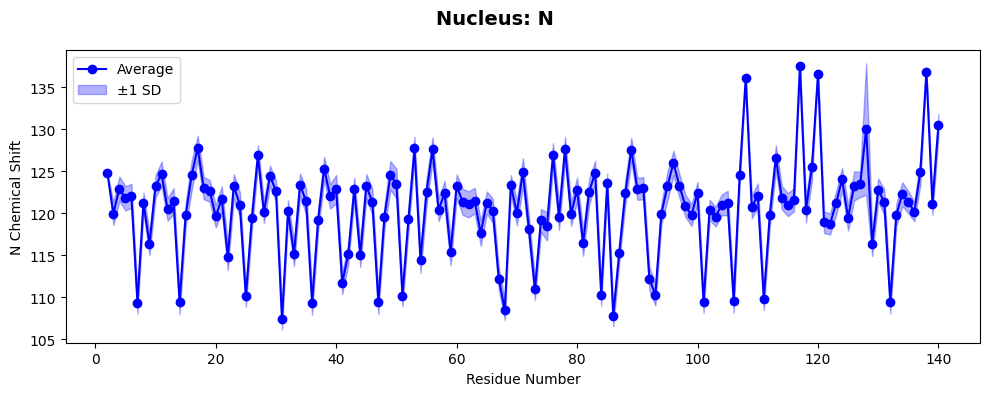

In [96]:
import numpy as np

colors = ["red", "blue", "green", "purple", "orange", "brown"]
nuclei = ["C", "CA", "CB", "HA", "H", "N"]
asyn_bmrbs = [6968, 26557, 52093, 16300, 51152, 19257, 16543]

# Create a figure for each nucleus
for nucleus in nuclei:
    fig, ax = plt.subplots(1, 1, figsize=(10, 4))
    fig.suptitle(f'Nucleus: {nucleus}', fontsize=14, fontweight='bold')
    
    # Collect all data for this nucleus across BMRBs
    all_residues = set()
    bmrb_data = {}
    
    for BMRBid in asyn_bmrbs:
        exp_data_path = '../../Data/Experiments/chemical_shift/BMRBid' + str(BMRBid)
        bmrb_local_file = exp_data_path + "/bmr" + str(BMRBid) + ".str"
        exp_data = parse_star_file(bmrb_local_file)
        
        # Filter to simulation residues
        print(bmrb_local_file)
        exp_data_filtered = {res: atoms for res, atoms in exp_data.items() if res in sim_residues_all}
        exp_residues = sorted(exp_data_filtered.keys())
        
        all_residues.update(exp_residues)
        bmrb_data[BMRBid] = exp_data_filtered
    
    # Calculate average and std for each residue
    all_residues = sorted(all_residues)
    avg_vals = []
    std_vals = []
    
    for res in all_residues:
        values = []
        for BMRBid in asyn_bmrbs:
            val = bmrb_data[BMRBid].get(res, {}).get(nucleus, None)
            if val is not None and not math.isnan(val):
                values.append(val)
        
        if values:
            avg_vals.append(np.mean(values))
            std_vals.append(np.std(values))
        else:
            avg_vals.append(math.nan)
            std_vals.append(math.nan)
    
    # Plot average with standard deviation as shaded area
    avg_vals = np.array(avg_vals)
    std_vals = np.array(std_vals)
    
    ax.plot(all_residues, avg_vals, marker="o", linestyle="-", color="blue", label='Average')
    ax.fill_between(all_residues, avg_vals - std_vals, avg_vals + std_vals, 
                     alpha=0.3, color="blue", label='±1 SD')
    
    ax.set_ylabel(f'{nucleus} Chemical Shift')
    ax.set_xlabel("Residue Number")
    ax.legend()
    plt.tight_layout()
    plt.show()

../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str


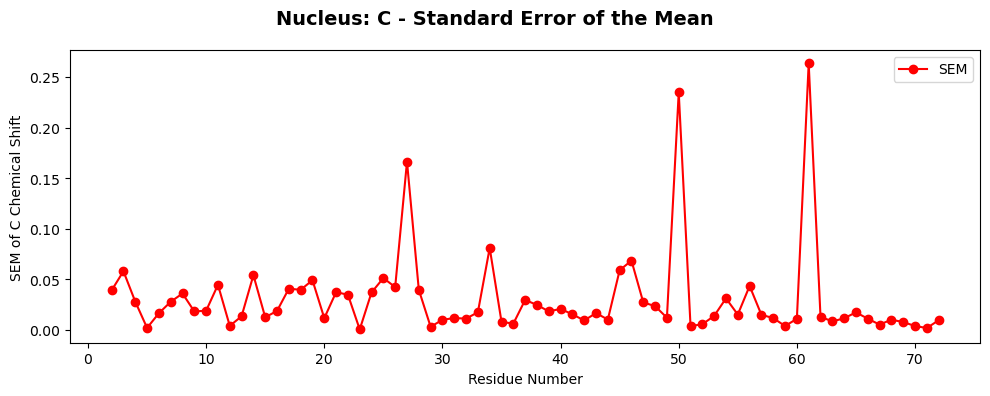

../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str


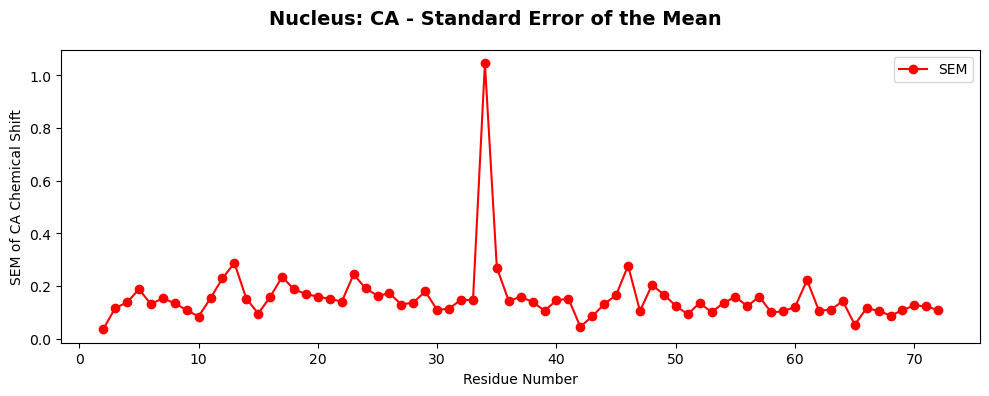

../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str


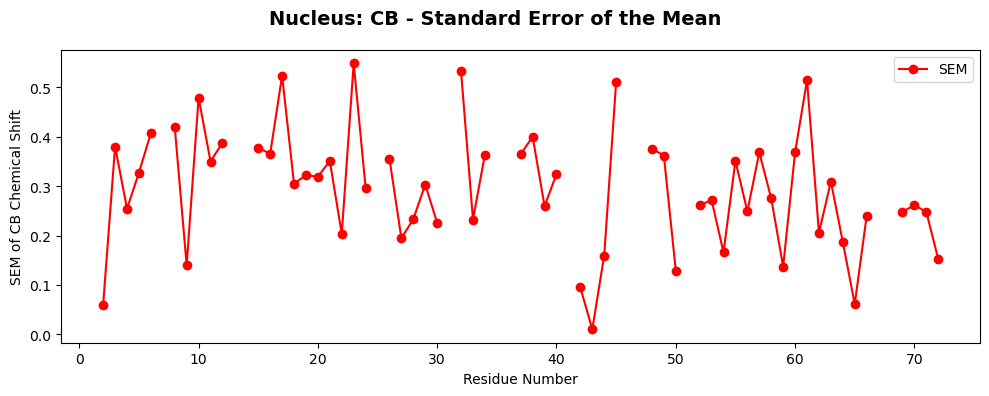

../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str


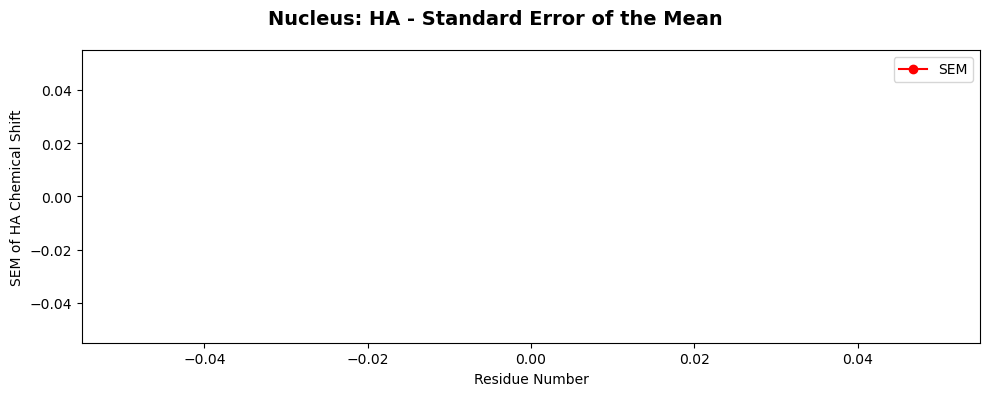

../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str


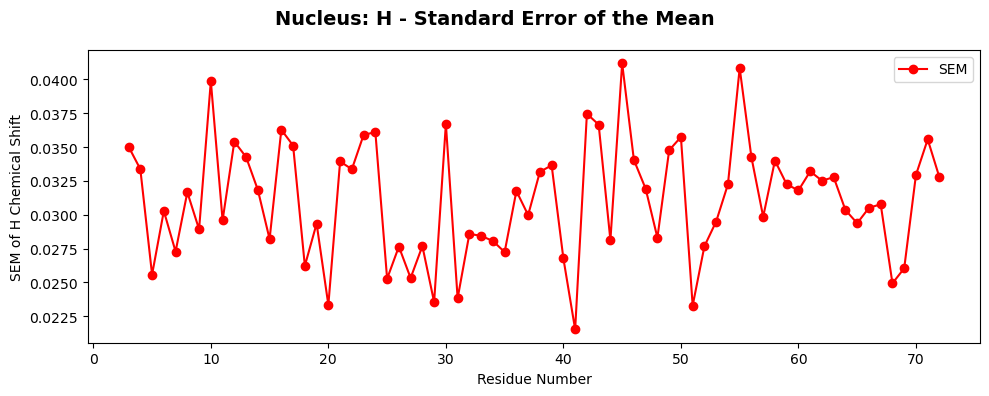

../../Data/Experiments/chemical_shift/BMRBid6968/bmr6968.str
../../Data/Experiments/chemical_shift/BMRBid26557/bmr26557.str
../../Data/Experiments/chemical_shift/BMRBid52093/bmr52093.str
../../Data/Experiments/chemical_shift/BMRBid16300/bmr16300.str
../../Data/Experiments/chemical_shift/BMRBid19257/bmr19257.str
../../Data/Experiments/chemical_shift/BMRBid16543/bmr16543.str


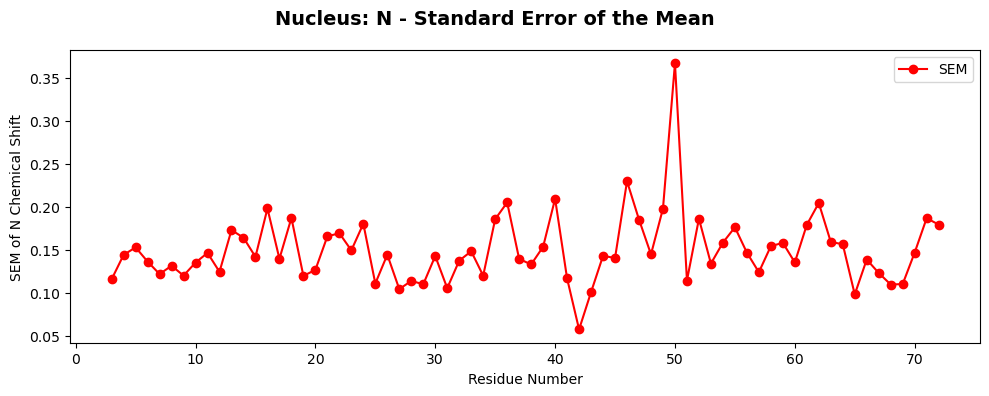

In [36]:
import numpy as np

colors = ["red", "blue", "green", "purple", "orange", "brown"]
nuclei = ["C", "CA", "CB", "HA", "H", "N"]
asyn_bmrbs = [6968, 26557, 52093, 16300, 19257, 16543]

# Create a figure for each nucleus
for nucleus in nuclei:
    fig, ax = plt.subplots(1, 1, figsize=(10, 4))
    fig.suptitle(f'Nucleus: {nucleus} - Standard Error of the Mean', fontsize=14, fontweight='bold')
    
    # Collect all data for this nucleus across BMRBs
    all_residues = set()
    bmrb_data = {}
    
    for BMRBid in asyn_bmrbs:
        exp_data_path = '../../Data/Experiments/chemical_shift/BMRBid' + str(BMRBid)
        bmrb_local_file = exp_data_path + "/bmr" + str(BMRBid) + ".str"
        exp_data = parse_star_file(bmrb_local_file)
        
        # Filter to simulation residues
        print(bmrb_local_file)
        exp_data_filtered = {res: atoms for res, atoms in exp_data.items() if res in sim_residues_all}
        exp_residues = sorted(exp_data_filtered.keys())
        
        all_residues.update(exp_residues)
        bmrb_data[BMRBid] = exp_data_filtered
    
    # Calculate SEM for each residue
    all_residues = sorted(all_residues)
    sem_vals = []
    
    for res in all_residues:
        values = []
        for BMRBid in asyn_bmrbs:
            val = bmrb_data[BMRBid].get(res, {}).get(nucleus, None)
            if val is not None and not math.isnan(val):
                values.append(val)
        
        if len(values) > 1:
            # SEM = std / sqrt(n)
            sem = np.std(values, ddof=1) / np.sqrt(len(values))
            sem_vals.append(sem)
        else:
            sem_vals.append(math.nan)
    
    # Plot SEM
    ax.plot(all_residues, sem_vals, marker="o", linestyle="-", color="red", label='SEM')
    
    ax.set_ylabel(f'SEM of {nucleus} Chemical Shift')
    ax.set_xlabel("Residue Number")
    ax.legend()
    plt.tight_layout()
    plt.show()

In [6]:
atom_accuracies = {
    'C': 1.5,
    'CA': 1.0,
    'CB': 1.3,
    'H': 0.55,
    'HA': 0.3,
    'N': 2.5
}


#protein = 'ChiZ1-64'
#protein = 'KRS1-72'
protein = 'asyn'

all_IDs = []
for system in systems:
    if protein in system['SYSTEM']:
        all_IDs.append(system['ID'])
IDs = all_IDs

system_ratios = {}

for system in systems:
    if system['ID'] in IDs:
        print(system['TRJ'], system['ID'],system['EXPERIMENT']['chemical_shift']['alignment_score'])
        dataFolder = '../../Data/Simulations/' + system['path']
        chemical_shifts_file_rmsd = dataFolder + 'chemical_shift_rmsd.yaml'
        ratio_sum = 0
        ratio_count = 0
        with open(chemical_shifts_file_rmsd) as f:
            rmsds = yaml.safe_load(f)
        for key in rmsds.keys():
            if key == 'differences':
                continue
            #print(atom_accuracies[key], rmsds[key])
            try:
                if atom_accuracies[key] < rmsds[key]:
                    
                    ratio = rmsds[key]/atom_accuracies[key]
                    ratio_sum += ratio
                    ratio_count +=1
                    print(key, ratio)
            except:
                continue
        if ratio_count > 0:
            system_ratio = round(ratio_sum/ratio_count,1)
        else:
            system_ratio = round(ratio_sum,1)
        system_ratios[system['TRJ'][0][0]] = system_ratio    
        print("Ratio average:", system_ratio)
        print("Ratio sum:", ratio_sum)
        print()

[['replica_02_AMBER03WS_md_2000ns.xtc']] 87 [-1, -1, -1, -1, -1]
CA 1.0235552814001327
CB 1.1140931456655965
Ratio average: 1.1
Ratio sum: 2.137648427065729

[['replica_04_DESAMBER_md_2000ns.xtc']] 93 [661.0, 661.0, 661.0, 661.0, 661.0]
Ratio average: 0
Ratio sum: 0

[['replica_04_CHARMM36M_md_2000ns.xtc']] 90 [670.0, 670.0, 670.0, 670.0, 670.0]
CA 1.0110760735855762
Ratio average: 1.0
Ratio sum: 1.0110760735855762

[['replica_01_DESAMBER_md_2000ns.xtc']] 71 [-1, -1, -1, -1, -1]
CA 2.2231750180364256
N 1.2821538166930635
Ratio average: 1.8
Ratio sum: 3.505328834729489

[['replica_03_DESAMBER_md_2000ns.xtc']] 76 [661.0, 661.0, 661.0, 661.0, 661.0]
CA 1.6826726942482366
N 1.2019603976602267
Ratio average: 1.4
Ratio sum: 2.884633091908463

[['replica_05_CHARMM36M_md_2000ns.xtc']] 88 [670.0, 670.0, 670.0, 670.0, 670.0]
Ratio average: 0
Ratio sum: 0

[['replica_01_CHARMM36M_md_2000ns.xtc']] 61 [-1, -1, -1, -1, -1]
CA 2.326613013367425
N 1.3567925290364176
Ratio average: 1.8
Ratio sum: 3.683

In [5]:

# sort by value
sorted_data = dict(sorted(system_ratios.items(), key=lambda x: x[1]))

# create a dataframe
df_sorted = pd.DataFrame(list(sorted_data.items()), columns=["Replica", "Value"])

# pretty print
print(df_sorted.to_string(index=False))



                                Replica  Value
      replica_04_DESAMBER_md_2000ns.xtc    0.0
     replica_05_CHARMM36M_md_2000ns.xtc    0.0
replica_04_AMBER99SB-DISP_md_2000ns.xtc    0.0
replica_05_AMBER99SB-DISP_md_2000ns.xtc    0.0
      replica_05_DESAMBER_md_2000ns.xtc    0.0
     replica_04_CHARMM36M_md_2000ns.xtc    1.0
replica_03_AMBER99SB-DISP_md_2000ns.xtc    1.0
     replica_02_AMBER03WS_md_2000ns.xtc    1.1
     replica_01_AMBER03WS_md_2000ns.xtc    1.1
     replica_05_AMBER03WS_md_2000ns.xtc    1.1
replica_01_AMBER99SB-DISP_md_2000ns.xtc    1.2
     replica_04_AMBER03WS_md_2000ns.xtc    1.2
     replica_03_AMBER03WS_md_2000ns.xtc    1.2
   replica_01_AMBER99SBWS_md_2000ns.xtc    1.3
   replica_02_AMBER99SBWS_md_2000ns.xtc    1.3
   replica_05_AMBER99SBWS_md_2000ns.xtc    1.3
   replica_03_AMBER99SBWS_md_2000ns.xtc    1.3
replica_02_AMBER99SB-DISP_md_2000ns.xtc    1.3
      replica_03_DESAMBER_md_2000ns.xtc    1.4
   replica_04_AMBER99SBWS_md_2000ns.xtc    1.4
     replica_

In [71]:
print(sorted_data_desc)

{'replica_04_AMBER99SB-DISP_md_2000ns.xtc': 7.2, 'replica_02_CHARMM36M_md_2000ns.xtc': 7.2, 'replica_04_AMBER03WS_md_2000ns.xtc': 7.2, 'replica_03_CHARMM36M_md_2000ns.xtc': 7.2, 'replica_02_DESAMBER_md_2000ns.xtc': 7.2, 'replica_02_AMBER99SB-DISP_md_2000ns.xtc': 7.0, 'replica_02_AMBER03WS_md_2000ns.xtc': 6.9, 'replica_01_AMBER99SB-DISP_md_2000ns.xtc': 6.9, 'replica_01_AMBER99SBWS_md_2000ns.xtc': 6.9, 'replica_02_AMBER99SBWS_md_2000ns.xtc': 6.9, 'replica_04_CHARMM36M_md_2000ns.xtc': 6.7, 'replica_04_DESAMBER_md_2000ns.xtc': 6.6, 'replica_05_CHARMM36M_md_2000ns.xtc': 6.6, 'replica_05_AMBER99SB-DISP_md_2000ns.xtc': 6.6, 'replica_04_AMBER99SBWS_md_2000ns.xtc': 6.6, 'replica_05_DESAMBER_md_2000ns.xtc': 6.6, 'replica_03_AMBER99SB-DISP_md_2000ns.xtc': 6.6, 'replica_05_AMBER99SBWS_md_2000ns.xtc': 6.6, 'replica_03_AMBER99SBWS_md_2000ns.xtc': 6.6, 'replica_05_AMBER03WS_md_2000ns.xtc': 6.6, 'replica_03_AMBER03WS_md_2000ns.xtc': 6.5, 'replica_03_DESAMBER_md_2000ns.xtc': 6.1, 'replica_01_DESAMBER_m

In [30]:
for system in systems:
    if 'syn' in system['SYSTEM']:
        if system['COMPOSITION']['PROTEIN']['SEQUENCE'] ==   'MDVFMKGLSKAKEGVVAAAEKTKQGVAEAAGKTKEGVLYVGSKTKEGVVHGVATVAEKTKEQVTNVGGAVVTGVTAVAQKTVEGAGSIAAATGFVKKDQLGKNEEGAPQEGILEDMPVDPDNEAYEMPSEEGYQDYEPEA':
            print(system['TRJ'], 1)
        elif system['COMPOSITION']['PROTEIN']['SEQUENCE'] == 'MDVFMKGLSKAKEGVVAAAEKTKQGVAEAAGKTKEGVLYVGSKTKEGVVXGVTTVAEKTKEQVTNVGGAVVTGVTAVAQKTVEGAGNIAAATGFVKKDQMGKGEEGYPQEGILEDMPVDPSSEAYEMPSEEGYQDYEPEA' or system['COMPOSITION']['PROTEIN']['SEQUENCE'] == 'MDVFMKGLSKAKEGVVAAAEKTKQGVAEAAGKTKEGVLYVGSKTKEGVVHGVTTVAEKTKEQVTNVGGAVVTGVTAVAQKTVEGAGNIAAATGFVKKDQMGKGEEGYPQEGILEDMPVDPSSEAYEMPSEEGYQDYEPEA': 
            print(system['TRJ'], 3)

        else:
            print(system['COMPOSITION']['PROTEIN']['SEQUENCE'])

[['replica_02_AMBER03WS_md_2000ns.xtc']] 1
[['replica_04_DESAMBER_md_2000ns.xtc']] 3
[['replica_04_CHARMM36M_md_2000ns.xtc']] 3
[['replica_01_DESAMBER_md_2000ns.xtc']] 1
[['replica_03_DESAMBER_md_2000ns.xtc']] 3
[['replica_05_CHARMM36M_md_2000ns.xtc']] 3
[['replica_01_CHARMM36M_md_2000ns.xtc']] 1
[['replica_04_AMBER99SB-DISP_md_2000ns.xtc']] 3
[['replica_01_AMBER99SB-DISP_md_2000ns.xtc']] 1
[['replica_05_AMBER99SB-DISP_md_2000ns.xtc']] 3
[['replica_04_AMBER99SBWS_md_2000ns.xtc']] 3
[['replica_02_CHARMM36M_md_2000ns.xtc']] 1
[['replica_05_DESAMBER_md_2000ns.xtc']] 3
[['replica_01_AMBER99SBWS_md_2000ns.xtc']] 1
[['replica_02_AMBER99SBWS_md_2000ns.xtc']] 1
[['replica_04_AMBER03WS_md_2000ns.xtc']] 3
[['replica_03_AMBER03WS_md_2000ns.xtc']] 3
[['replica_03_CHARMM36M_md_2000ns.xtc']] 3
[['replica_03_AMBER99SB-DISP_md_2000ns.xtc']] 3
[['replica_05_AMBER99SBWS_md_2000ns.xtc']] 3
[['replica_03_AMBER99SBWS_md_2000ns.xtc']] 3
[['replica_02_AMBER99SB-DISP_md_2000ns.xtc']] 1
[['replica_05_AMBER03WS